In [52]:
#!/usr/bin/env python3

import scrapy
from scrapy.crawler import CrawlerProcess
from scrapy.utils.project import get_project_settings
import pandas as pd
# from amazon_scraping.spiders.acquisitions import AcquisitionsSpider

# used just for human readable json
import json
import re

from nltk.tokenize import word_tokenize 
from nltk.corpus import stopwords
stop = stopwords.words('english')

import os
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

import matplotlib.pyplot as plt
# % matplotlib inline


In [2]:
from company_scraper import scrape

output = scrape()

2019-12-04 09:58:10 [scrapy.crawler] INFO: Overridden settings: {'BOT_NAME': 'amazon_scraping', 'NEWSPIDER_MODULE': 'amazon_scraping.spiders', 'ROBOTSTXT_OBEY': True, 'SPIDER_MODULES': ['amazon_scraping.spiders']}
2019-12-04 09:58:10 [scrapy.extensions.telnet] INFO: Telnet Password: 895b9be4c156f3ce
2019-12-04 09:58:10 [scrapy.middleware] INFO: Enabled extensions:
['scrapy.extensions.corestats.CoreStats',
 'scrapy.extensions.telnet.TelnetConsole',
 'scrapy.extensions.memusage.MemoryUsage',
 'scrapy.extensions.logstats.LogStats']
2019-12-04 09:58:10 [scrapy.middleware] INFO: Enabled downloader middlewares:
['scrapy.downloadermiddlewares.robotstxt.RobotsTxtMiddleware',
 'scrapy.downloadermiddlewares.httpauth.HttpAuthMiddleware',
 'scrapy.downloadermiddlewares.downloadtimeout.DownloadTimeoutMiddleware',
 'scrapy.downloadermiddlewares.defaultheaders.DefaultHeadersMiddleware',
 'scrapy.downloadermiddlewares.useragent.UserAgentMiddleware',
 'scrapy.downloadermiddlewares.retry.RetryMiddleware

2019-12-04 09:58:13 [scrapy.middleware] INFO: Enabled spider middlewares:
['scrapy.spidermiddlewares.httperror.HttpErrorMiddleware',
 'scrapy.spidermiddlewares.offsite.OffsiteMiddleware',
 'scrapy.spidermiddlewares.referer.RefererMiddleware',
 'scrapy.spidermiddlewares.urllength.UrlLengthMiddleware',
 'scrapy.spidermiddlewares.depth.DepthMiddleware']
2019-12-04 09:58:13 [scrapy.middleware] INFO: Enabled item pipelines:
[]
2019-12-04 09:58:13 [scrapy.core.engine] INFO: Spider opened
2019-12-04 09:58:13 [scrapy.extensions.logstats] INFO: Crawled 0 pages (at 0 pages/min), scraped 0 items (at 0 items/min)
2019-12-04 09:58:13 [scrapy.extensions.telnet] INFO: Telnet console listening on 127.0.0.1:6023
2019-12-04 09:58:14 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikipedia.org/robots.txt> (referer: None)
2019-12-04 09:58:14 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikipedia.org/wiki/Netflix> (referer: None)
2019-12-04 09:58:15 [scrapy.core.engine] DEBUG: Crawl

['874', '60']


2019-12-04 09:58:15 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://siccode.com/robots.txt> (referer: None)
2019-12-04 09:58:15 [protego] DEBUG: Rule at line 1 without any user agent to enforce it on.
2019-12-04 09:58:16 [scrapy.downloadermiddlewares.redirect] DEBUG: Redirecting (301) to <GET https://siccode.com/business/amazon-com-inc> from <GET https://siccode.com/business/Amazon-com-Inc>
2019-12-04 09:58:16 [scrapy.downloadermiddlewares.redirect] DEBUG: Redirecting (301) to <GET https://siccode.com/business/etsy> from <GET https://siccode.com/business/Etsy>
2019-12-04 09:58:16 [scrapy.downloadermiddlewares.redirect] DEBUG: Redirecting (301) to <GET https://siccode.com/business/woot-inc> from <GET https://siccode.com/business/Woot-Inc>
2019-12-04 09:58:16 [scrapy.downloadermiddlewares.redirect] DEBUG: Redirecting (301) to <GET https://siccode.com/business/netflix-inc> from <GET https://siccode.com/business/Netflix-Inc>
2019-12-04 09:58:16 [scrapy.downloadermiddlewares.redirect

In [13]:
output

{'parent_company': {'organization': 'Amazon.com, Inc.',
  'founded': 'July 5, 1994',
  'industry': ['Cloud computing',
   'E-commerce',
   'Artificial intelligence',
   'Consumer electronics',
   'Digital distribution',
   'Grocery stores'],
  'products': ['Amazon Echo',
   'Amazon Fire',
   'Amazon Fire TV',
   'Amazon Fire OS',
   'Amazon Kindle'],
  'number_of_employees': '647500',
  'location': 'Seattle',
  'founder': 'Jeff Bezos',
  'summary': 'Amazon.com, Inc.[6] (/ˈæməzɒn/), is an American multinational technology company based in Seattle that focuses on e-commerce, cloud computing, digital streaming, and artificial intelligence. It is considered one of the Big Four tech companies, along with Google, Apple, and Facebook.[7][8][9]\n',
  'raw_text': 'Amazon.com, Inc.[6] (/ˈæməzɒn/), is an American multinational technology company based in Seattle that focuses on e-commerce, cloud computing, digital streaming, and artificial intelligence. It is considered one of the Big Four tech c

In [ ]:
text_e = output["competitors"]['Etsy']['summary'].strip('\n').lower()

In [72]:
for n in output['competitors']:
        print(output['competitors'][n]['raw_text'])

Netflix, Inc. (/ˈnɛtflɪks/) is an American media-services provider and production company headquartered in Los Gatos, California, founded in 1997 by Reed Hastings and Marc Randolph in Scotts Valley, California. The company's primary business is its subscription-based streaming service which offers online streaming of a library of films and television programs, including those produced in-house.[9] As of April 2019, Netflix had over 148 million paid subscriptions worldwide, including 60 million in the United States, and over 154 million subscriptions total including free trials.[8] It is available worldwide except in mainland China (due to local restrictions), Syria, North Korea, and Crimea (due to US sanctions). The company also has offices in the Netherlands, Brazil, India, Japan, and South Korea.[10] Netflix is a member of the Motion Picture Association (MPA).
Netflix's initial business model included DVD sales and rental by mail, but Hastings abandoned the sales about a year after t

In [78]:
text_e = output['competitors']['Etsy']['raw_text']
text_f = output['competitors']['FedEx']['raw_text']
text_n = output['competitors']['Netflix']['raw_text']

text_wf = output['acquisitions']['Whole Foods Market']['raw_text']
text_z = output['acquisitions']['Zappos']['raw_text']
text_w = output['acquisitions']['Woot']['raw_text']

text_a = output['parent_company']['raw_text']

In [15]:
import stanfordnlp
stanfordnlp.download('en')

Using the default treebank "en_ewt" for language "en".
Would you like to download the models for: en_ewt now? (Y/n)
n


In [16]:
nlp = stanfordnlp.Pipeline()#processors = "tokenize,mwt,lemma,pos")

Use device: cpu
---
Loading: tokenize
With settings: 
{'model_path': '/Users/bond/stanfordnlp_resources/en_ewt_models/en_ewt_tokenizer.pt', 'lang': 'en', 'shorthand': 'en_ewt', 'mode': 'predict'}
---
Loading: pos
With settings: 
{'model_path': '/Users/bond/stanfordnlp_resources/en_ewt_models/en_ewt_tagger.pt', 'pretrain_path': '/Users/bond/stanfordnlp_resources/en_ewt_models/en_ewt.pretrain.pt', 'lang': 'en', 'shorthand': 'en_ewt', 'mode': 'predict'}
---
Loading: lemma
With settings: 
{'model_path': '/Users/bond/stanfordnlp_resources/en_ewt_models/en_ewt_lemmatizer.pt', 'lang': 'en', 'shorthand': 'en_ewt', 'mode': 'predict'}
Building an attentional Seq2Seq model...
Using a Bi-LSTM encoder
Using soft attention for LSTM.
Finetune all embeddings.
[Running seq2seq lemmatizer with edit classifier]
---
Loading: depparse
With settings: 
{'model_path': '/Users/bond/stanfordnlp_resources/en_ewt_models/en_ewt_parser.pt', 'pretrain_path': '/Users/bond/stanfordnlp_resources/en_ewt_models/en_ewt.pr

In [79]:
text_e = output['competitors']['Etsy']['raw_text']
text_f = output['competitors']['FedEx']['raw_text']
text_n = output['competitors']['Netflix']['raw_text']

text_wf = output['acquisitions']['Whole Foods Market']['raw_text']
text_z = output['acquisitions']['Zappos']['raw_text']
text_w = output['acquisitions']['Woot']['raw_text']

text_a = output['parent_company']['raw_text']


doc_e = nlp(text_e)
doc_f = nlp(text_f)
doc_n = nlp(text_n)

doc_wf = nlp(text_wf)
doc_z = nlp(text_z)
doc_w = nlp(text_w)

doc = nlp(text_a)

2019-12-04 13:03:42 [py.warnings] WARNING: ../aten/src/ATen/native/LegacyDefinitions.cpp:19: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead.

2019-12-04 13:03:49 [py.warnings] WARNING: ../aten/src/ATen/native/LegacyDefinitions.cpp:19: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead.

2019-12-04 13:04:16 [py.warnings] WARNING: ../aten/src/ATen/native/LegacyDefinitions.cpp:19: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead.

2019-12-04 13:04:18 [py.warnings] WARNING: ../aten/src/ATen/native/LegacyDefinitions.cpp:19: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead.

2019-12-04 13:04:21 [py.warnings] WA

In [80]:
#dictionary that contains pos tags and their explanations
pos_dict = {
    'CC': 'coordinating conjunction',
    'CD': 'cardinal digit',
    'DT': 'determiner',
    'EX': 'existential there (like: \"there is\" ... think of it like \"there exists\")',
    'FW': 'foreign word',
    'IN':  'preposition/subordinating conjunction',
    'JJ': 'adjective \'big\'',
    'JJR': 'adjective, comparative \'bigger\'',
    'JJS': 'adjective, superlative \'biggest\'',
    'LS': 'list marker 1)',
    'MD': 'modal could, will',
    'NN': 'noun, singular \'desk\'',
    'NNS': 'noun plural \'desks\'',
    'NNP': 'proper noun, singular \'Harrison\'',
    'NNPS': 'proper noun, plural \'Americans\'',
    'PDT': 'predeterminer \'all the kids\'',
#     'POS': 'possessive ending parent\'s',
    'PRP': 'personal pronoun I, he, she',
    'PRP$': 'possessive pronoun my, his, hers',
    'RB': 'adverb very, silently,',
    'RBR': 'adverb, comparative better',
    'RBS': 'adverb, superlative best',
    'RP': 'particle give up',
    'TO': 'to go \'to\' the store.',
    'UH': 'interjection errrrrrrrm',
    'VB': 'verb, base form take',
    'VBD': 'verb, past tense took',
    'VBG': 'verb, gerund/present participle taking',
    'VBN': 'verb, past participle taken',
    'VBP': 'verb, sing. present, non-3d take',
    'VBZ': 'verb, 3rd person sing. present takes',
    'WDT': 'wh-determiner which',
    'WP': 'wh-pronoun who, what',
    'WP$': 'possessive wh-pronoun whose',
    'WRB': 'wh-abverb where, when',
    'QF' : 'quantifier, bahut, thoda, kam (Hindi)',
    'VM' : 'main verb',
    'PSP' : 'postposition, common in indian langs',
    'DEM' : 'demonstrative, common in indian langs'
}

In [81]:
for pos in pos_dict:
    print(pos)

CC
CD
DT
EX
FW
IN
JJ
JJR
JJS
LS
MD
NN
NNS
NNP
NNPS
PDT
PRP
PRP$
RB
RBR
RBS
RP
TO
UH
VB
VBD
VBG
VBN
VBP
VBZ
WDT
WP
WP$
WRB
QF
VM
PSP
DEM


In [82]:
#extract parts of speech
def extract_pos(doc):
    parsed_text = {'word':[], 'pos':[], 'exp':[]}
    for sent in doc.sentences:
        for wrd in sent.words:
            if wrd.pos in pos_dict.keys():
                pos_exp = pos_dict[wrd.pos]
            else:
                pos_exp = 'NA'
            parsed_text['word'].append(wrd.text)
            parsed_text['pos'].append(wrd.pos)
            parsed_text['exp'].append(pos_exp)
    #return a dataframe of pos and text
    return pd.DataFrame(parsed_text)

#extract pos
pos_df = extract_pos(doc)
pos_df_wf = extract_pos(doc_wf)
pos_df_w = extract_pos(doc_w)
pos_df_z = extract_pos(doc_z)
pos_df_e = extract_pos(doc_e)
pos_df_n = extract_pos(doc_n)
pos_df_f = extract_pos(doc_f)

CC


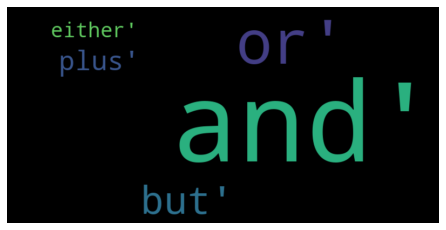

CD


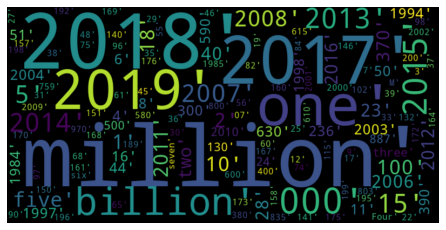

DT


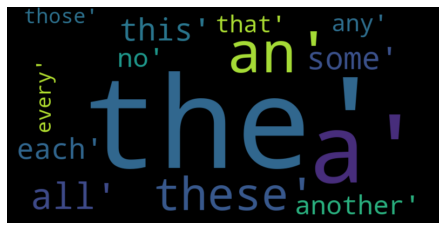

EX


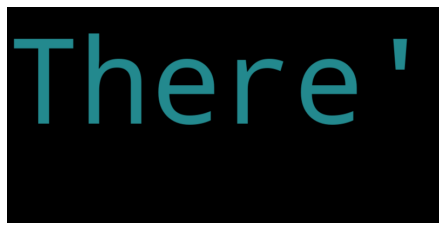

FW


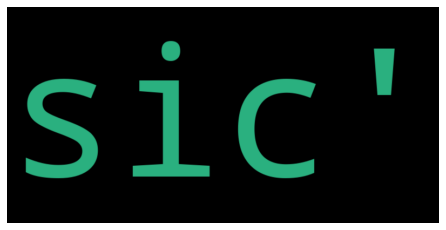

IN


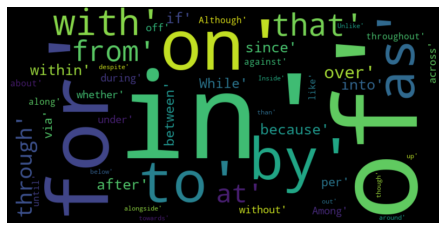

JJ


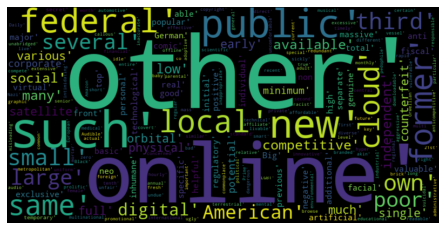

JJR


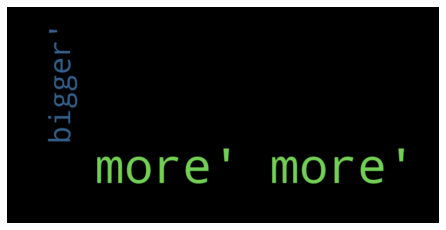

JJS


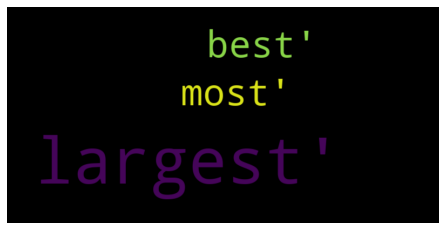

LS


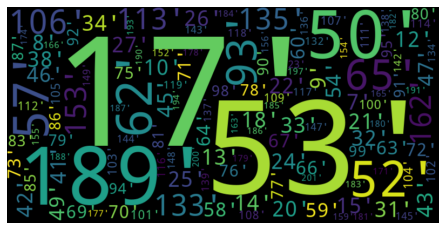

MD


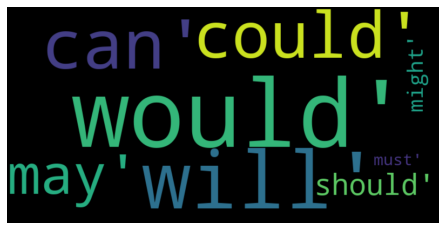

NN


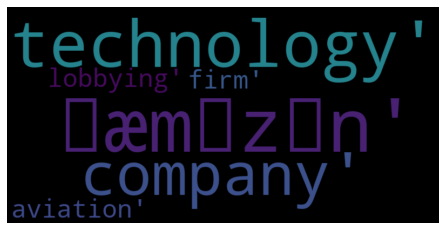

NNS


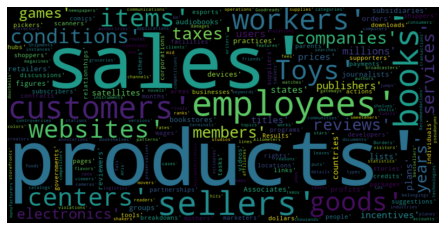

NNP


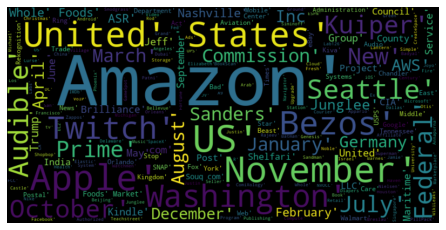

NNPS


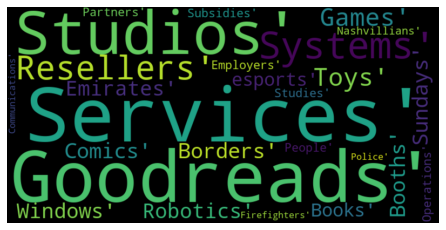

PDT


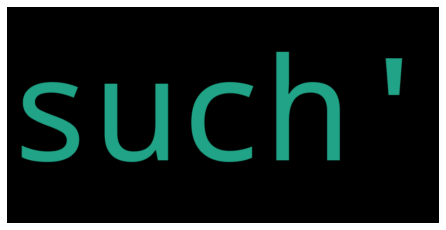

PRP


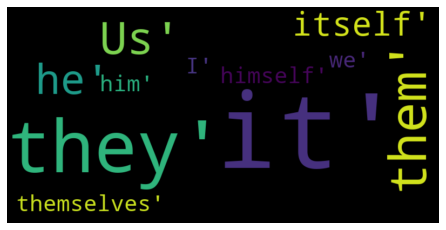

PRP$


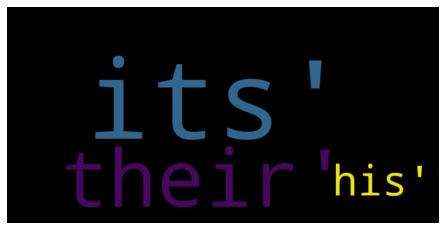

RB


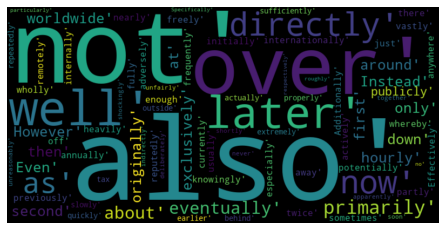

RBR


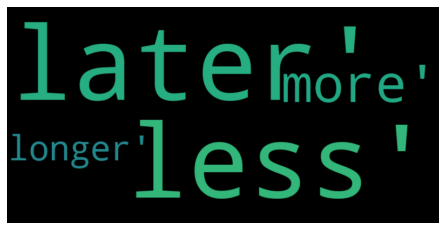

RBS


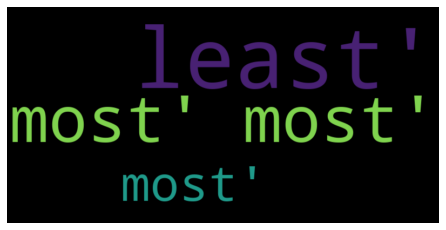

RP


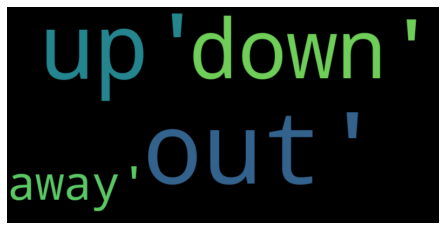

TO


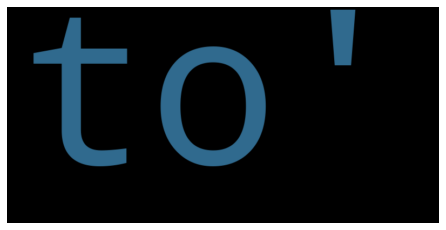

VB


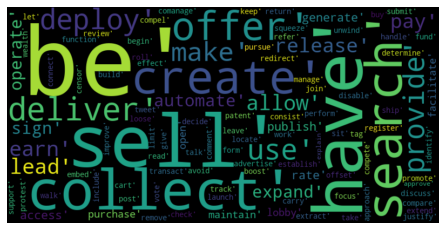

VBD


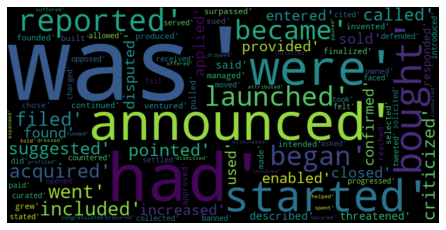

VBG


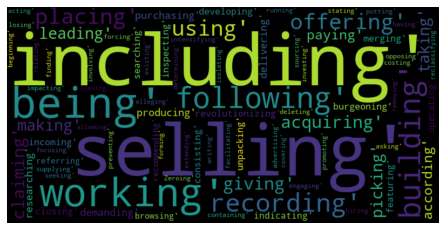

VBN


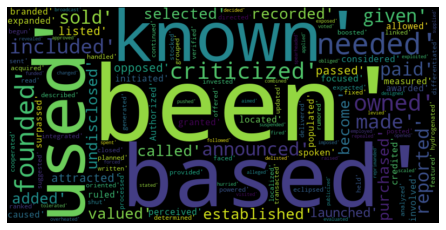

VBP


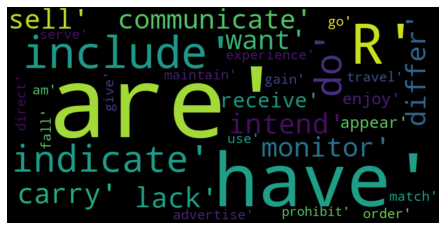

VBZ


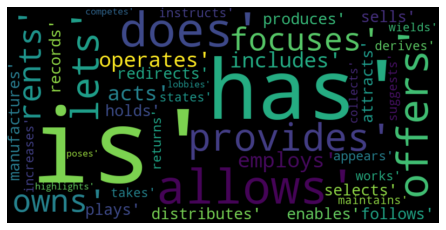

WDT


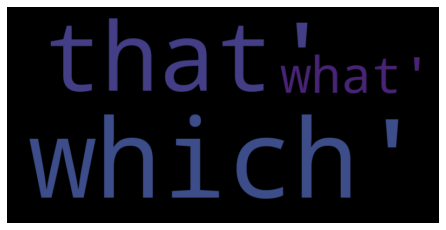

WP


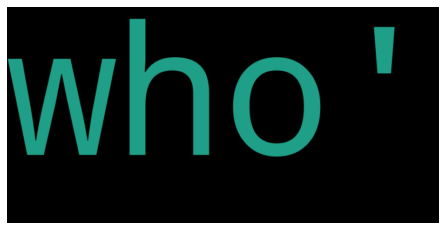

WRB


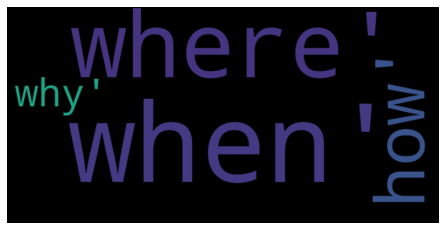

In [130]:
bad_char = ["[1]", '[2]', '[3]', '[4]', '[5]']
text = {}

if not os.path.exists('Figures'):
    os.mkdir('Figures')

if not os.path.exists('Figures/Amazon_POS'):
    os.mkdir('Figures/Amazon_POS')
    

for pos in pos_dict:
    text[pos] = pos_df[pos_df['pos'] == str(pos)]
    if len(pos_df[pos_df['pos'] == str(pos)]) == 0:
        pass
    else:
        print(pos)
        wordcloud = WordCloud(width=800, height=400).generate(str(text[pos].word.values))

        # Display the generated image:
        f = plt.figure()
        plt.imshow(wordcloud, interpolation = 'bilinear')
        plt.axis('off')
        plt.tight_layout(pad=0)
        plt.show()

   
        f.savefig(os.path.join('Figures/Amazon_POS','{}_cloud.jpg'.format(pos)), dpi=1000, transparent=True) 

CC


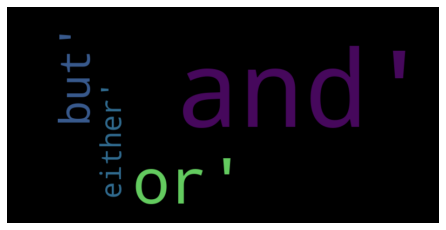

CD


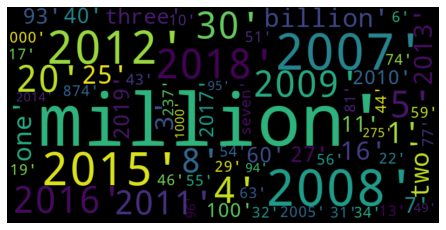

DT


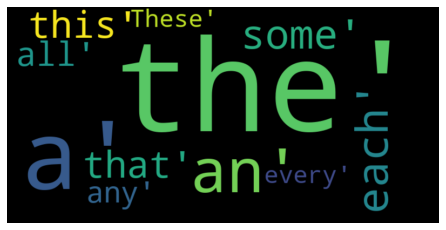

EX


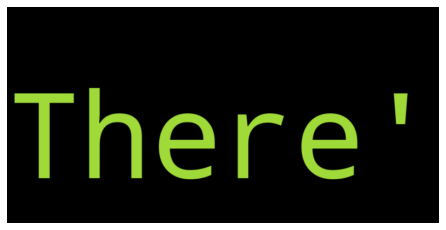

IN


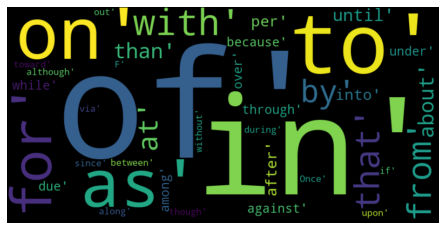

JJ


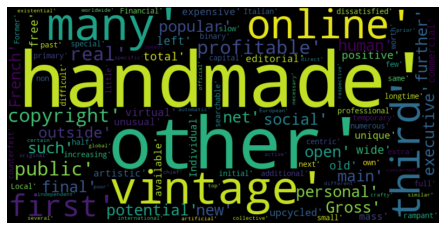

JJR


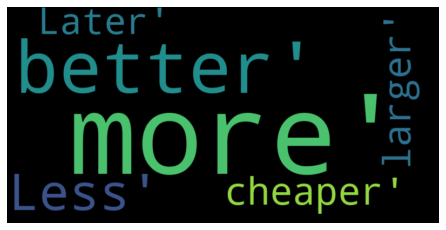

JJS


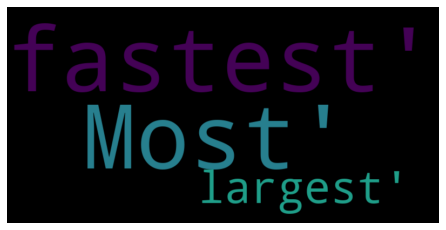

LS


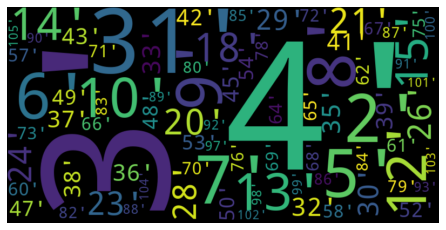

MD


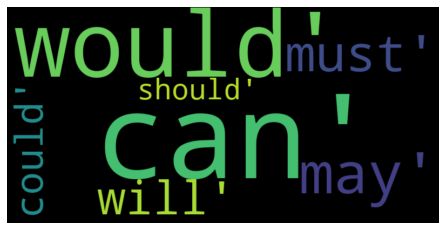

NN


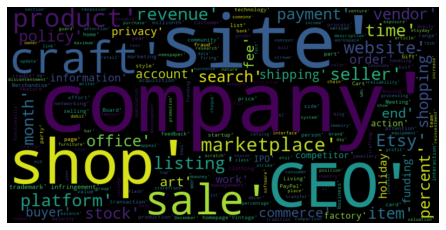

NNS


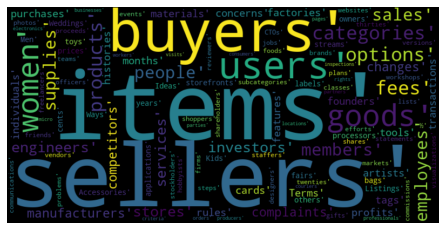

NNP


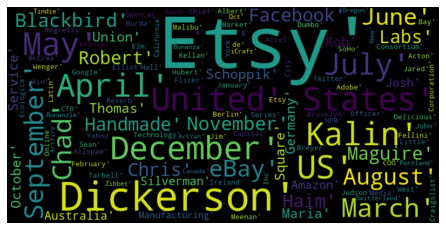

NNPS


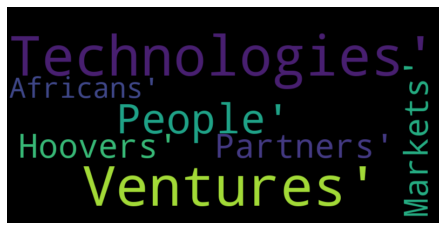

PRP


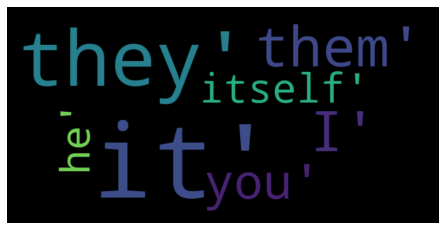

PRP$


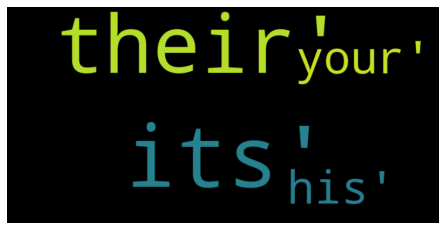

RB


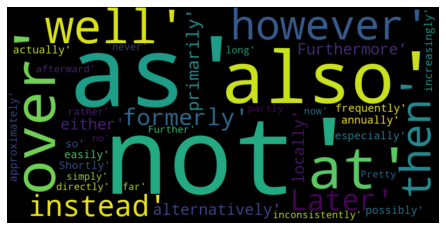

RBR


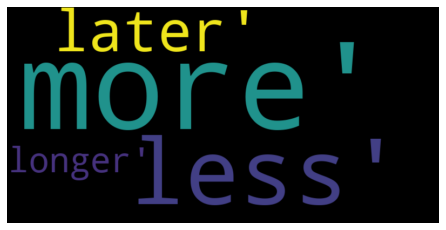

RBS


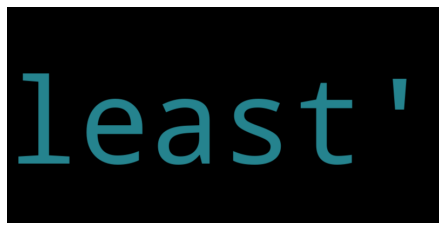

RP


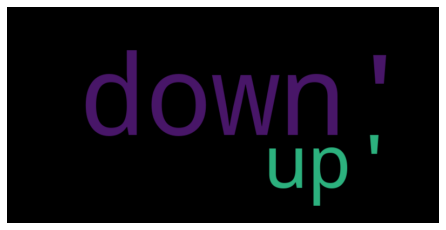

TO


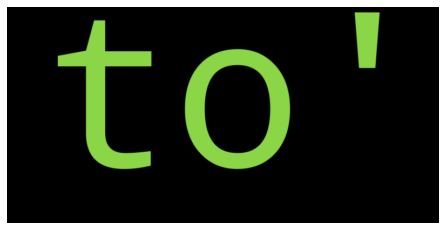

UH


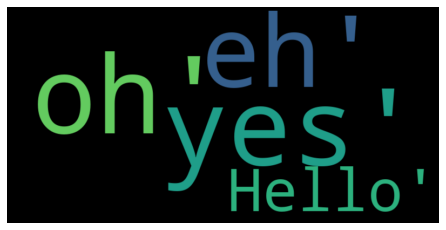

VB


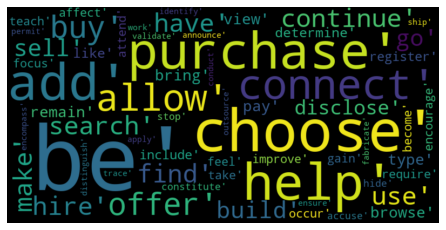

VBD


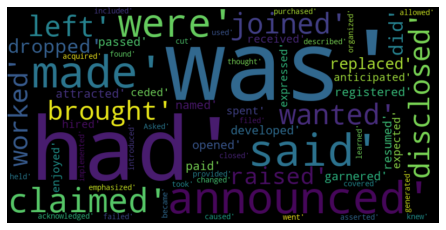

VBG


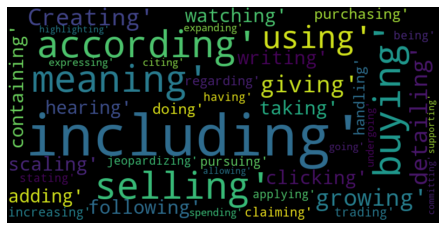

VBN


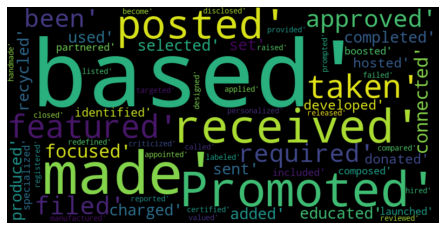

VBP


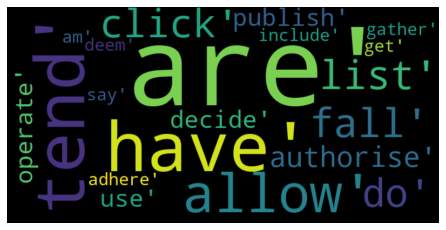

VBZ


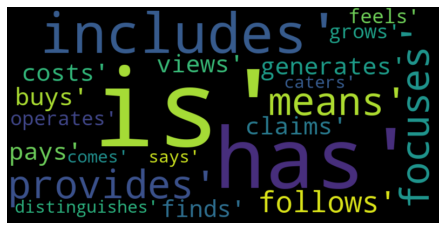

WDT


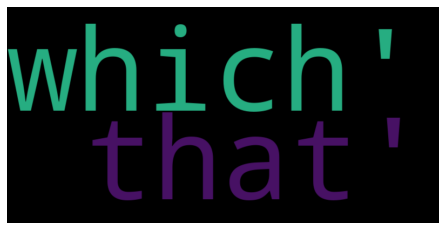

WP


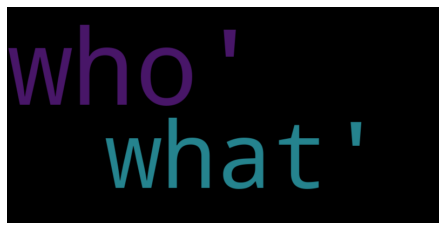

WRB


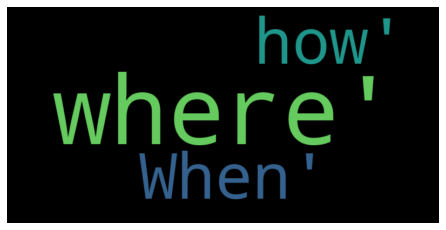

In [131]:
bad_char = ["[1]", '[2]', '[3]', '[4]', '[5]']
text = {}

if not os.path.exists('Figures'):
    os.mkdir('Figures')

if not os.path.exists('Figures/Etsy_POS'):
    os.mkdir('Figures/Etsy_POS')
    

for pos in pos_dict:
    text[pos] = pos_df_e[pos_df_e['pos'] == str(pos)]
    if len(pos_df_e[pos_df_e['pos'] == str(pos)]) == 0:
        pass
    else:
        print(pos)
        wordcloud = WordCloud(width=800, height=400).generate(str(text[pos].word.values))

        # Display the generated image:
        f = plt.figure()
        plt.imshow(wordcloud, interpolation = 'bilinear')
        plt.axis('off')
        plt.tight_layout(pad=0)
        plt.show()

   
        f.savefig(os.path.join('Figures/Etsy_POS','{}_cloud.jpg'.format(pos)), dpi=1000)

CC


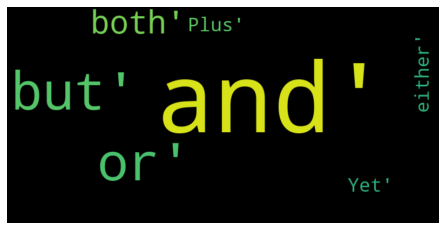

CD


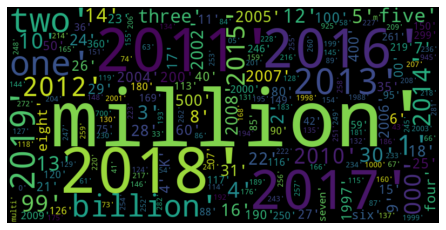

DT


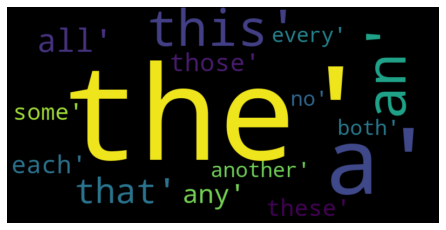

EX


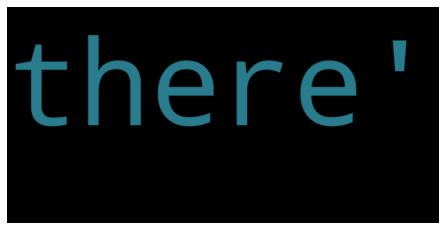

IN


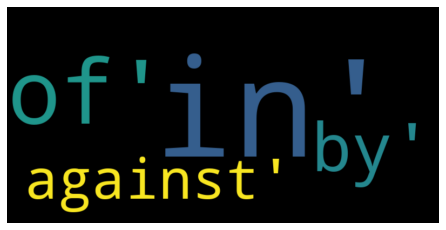

JJ


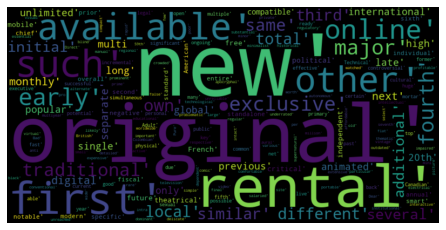

JJR


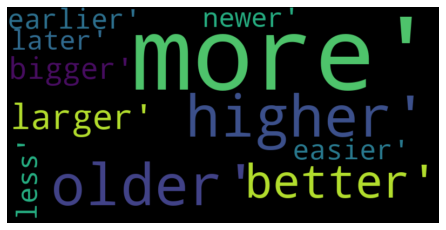

JJS


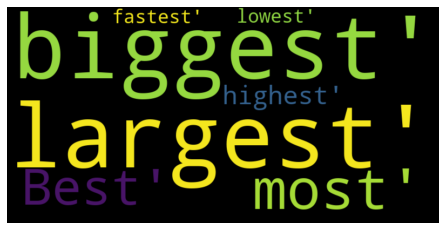

LS


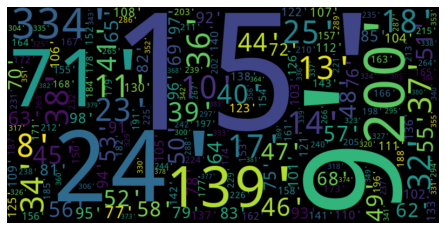

MD


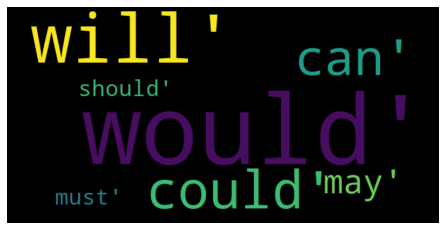

NN


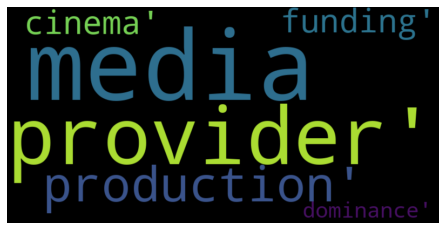

NNS


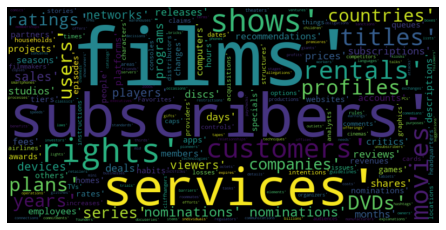

NNP


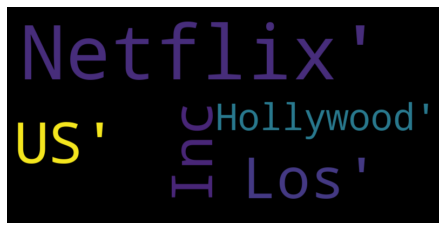

NNPS


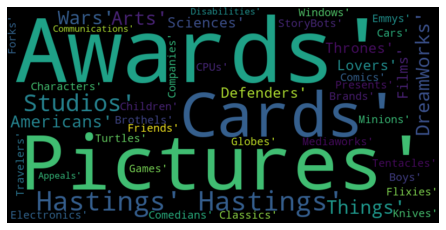

PDT


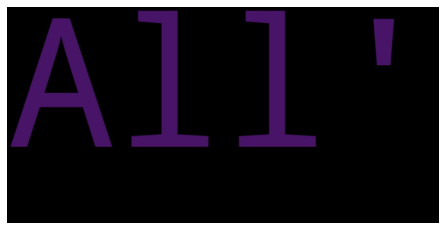

PRP


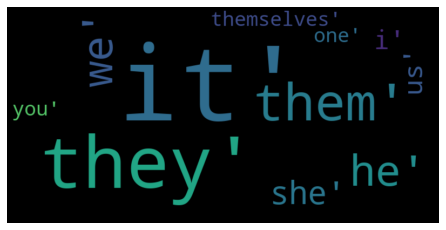

PRP$


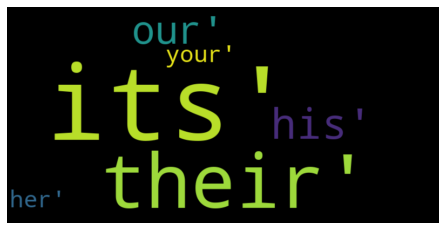

RB


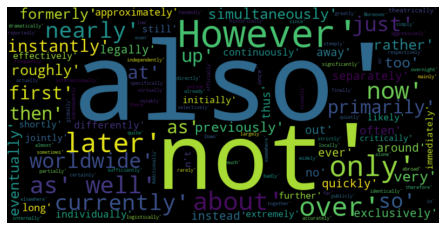

RBR


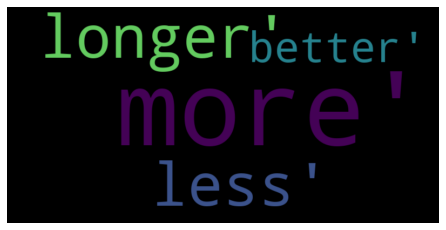

RBS


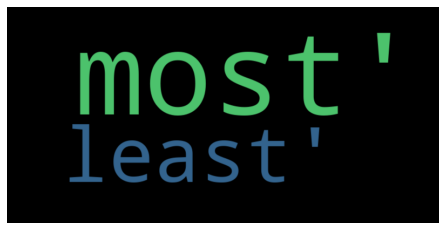

RP


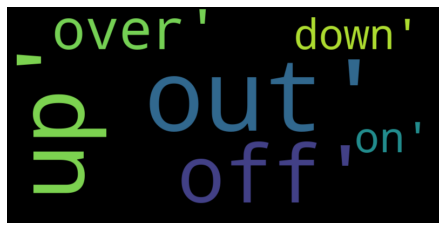

TO


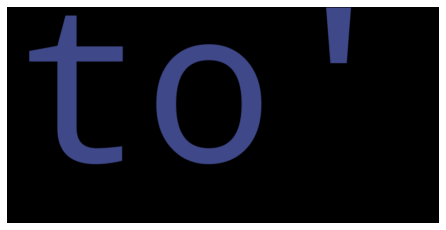

VB


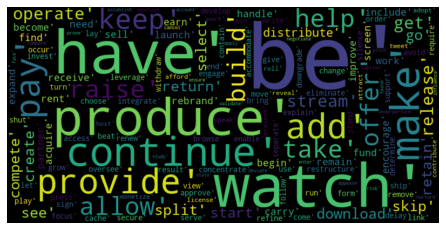

VBD


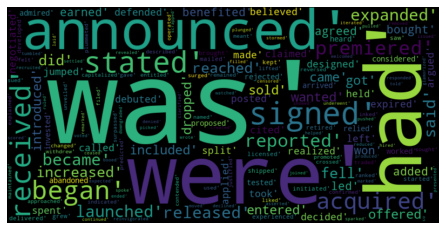

VBG


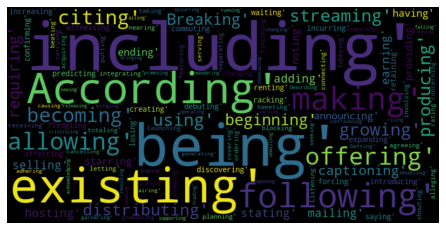

VBN


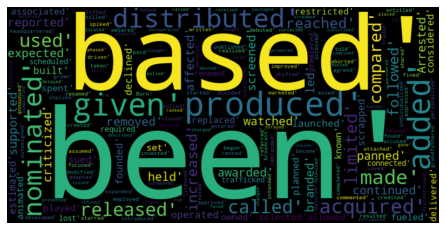

VBP


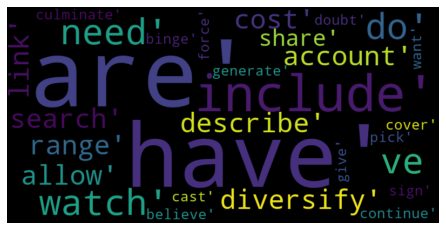

VBZ


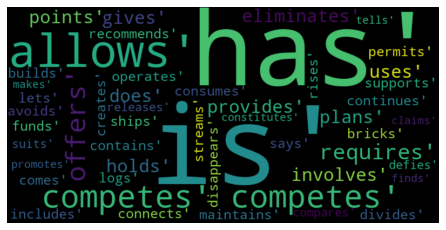

WDT


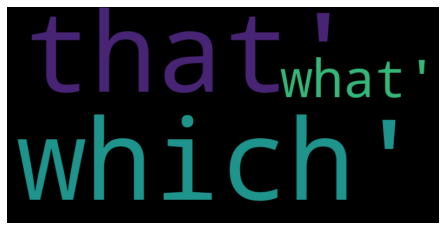

WP


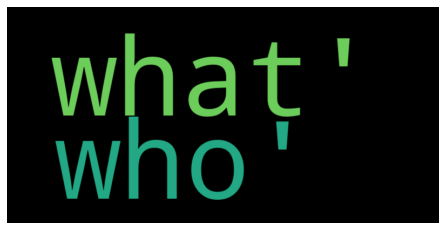

WP$


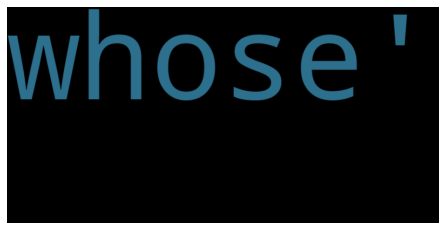

WRB


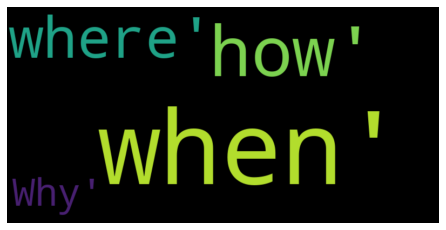

In [132]:
bad_char = ["[1]", '[2]', '[3]', '[4]', '[5]']
text = {}

if not os.path.exists('Figures'):
    os.mkdir('Figures')

if not os.path.exists('Figures/Netflix_POS'):
    os.mkdir('Figures/Netflix_POS')
    

for pos in pos_dict:
    text[pos] = pos_df_n[pos_df_n['pos'] == str(pos)]
    if len(pos_df_n[pos_df_n['pos'] == str(pos)]) == 0:
        pass
    else:
        print(pos)
        wordcloud = WordCloud(width=800, height=400).generate(str(text[pos].word.values))

        # Display the generated image:
        f = plt.figure()
        plt.imshow(wordcloud, interpolation = 'bilinear')
        plt.axis('off')
        plt.tight_layout(pad=0)
        plt.show()

   
        f.savefig(os.path.join('Figures/Netflix_POS','{}_cloud.jpg'.format(pos)), dpi=1000)

CC


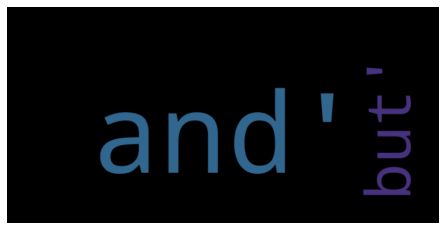

CD


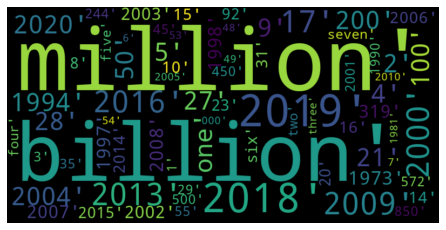

DT


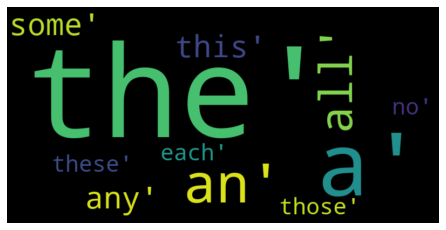

IN


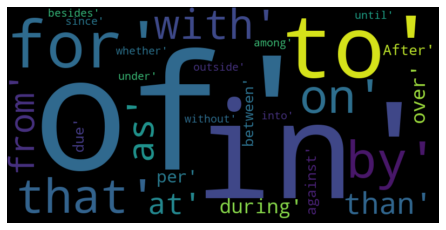

JJ


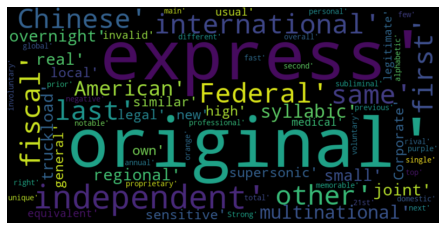

JJR


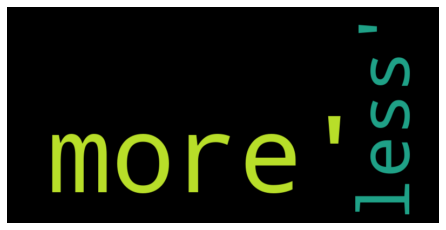

JJS


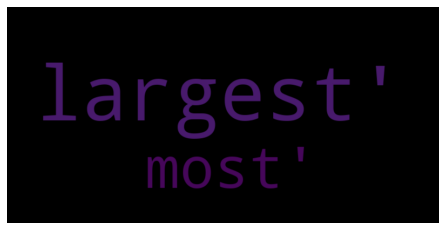

LS


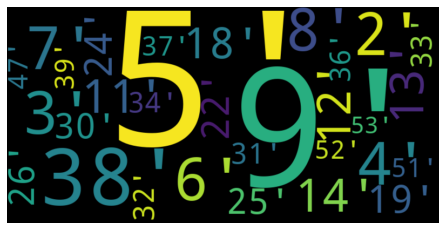

MD


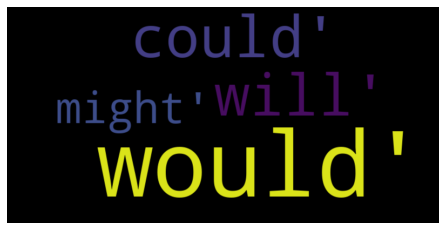

NN


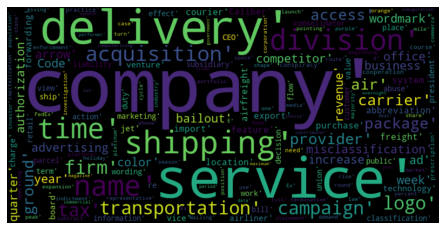

NNS


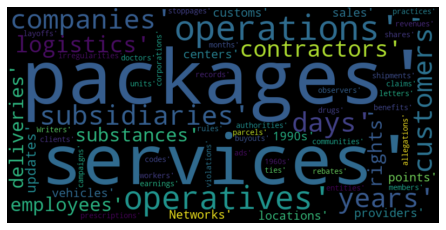

NNP


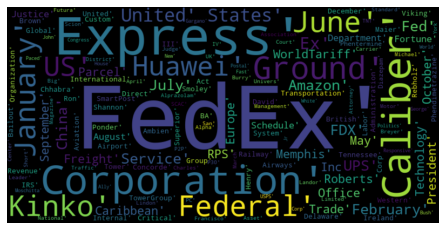

NNPS


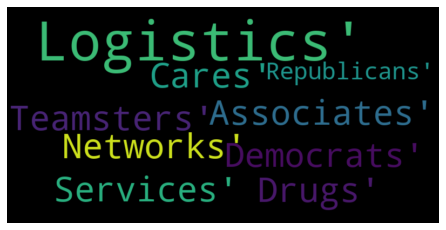

PRP


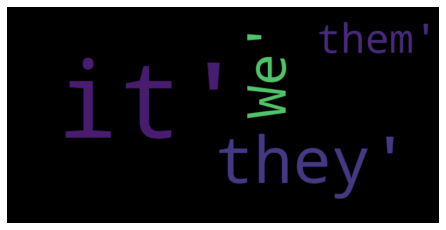

PRP$


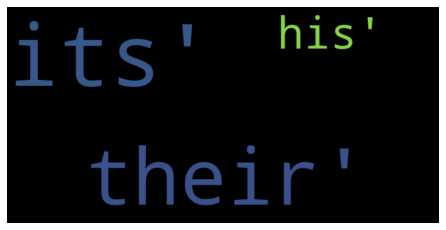

RB


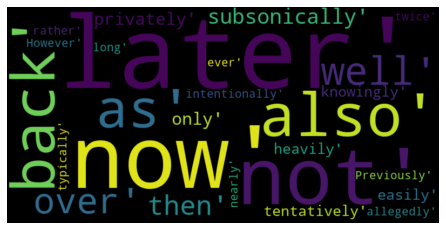

RBR


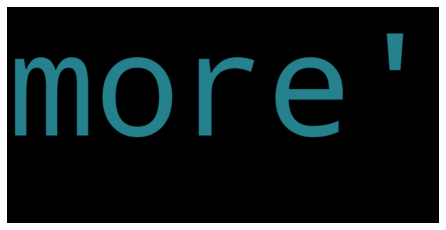

RBS


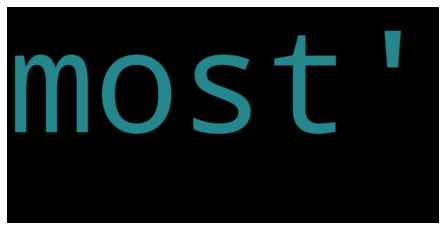

TO


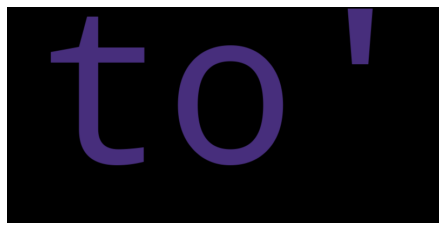

VB


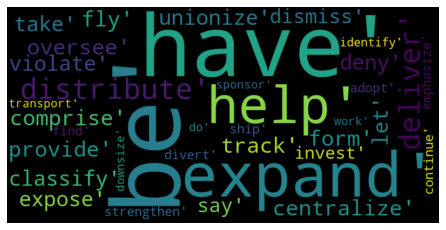

VBD


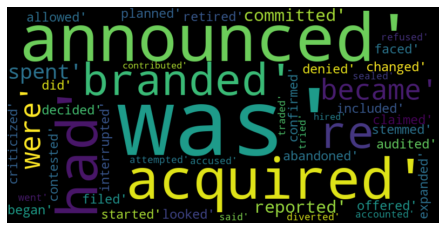

VBG


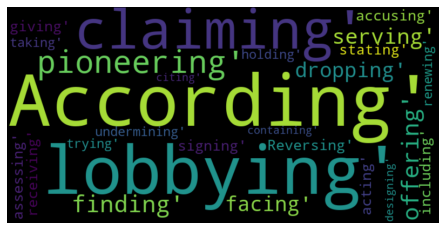

VBN


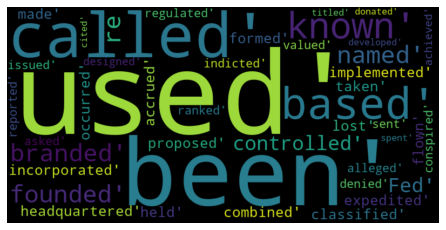

VBP


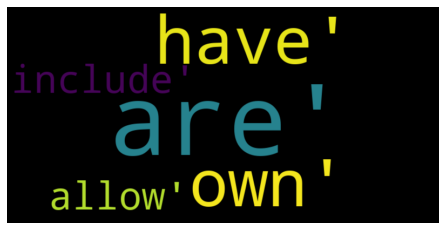

VBZ


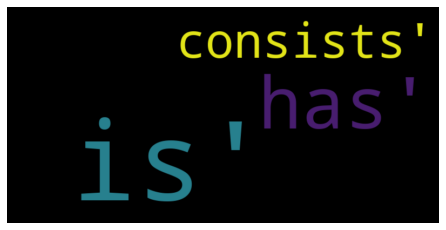

WDT


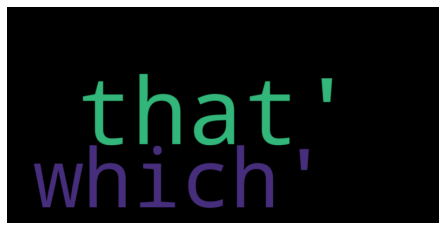

WP


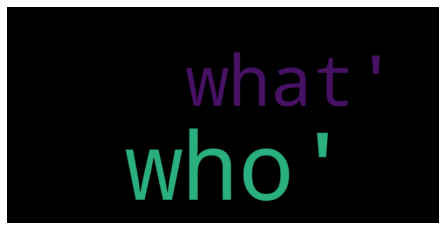

WRB


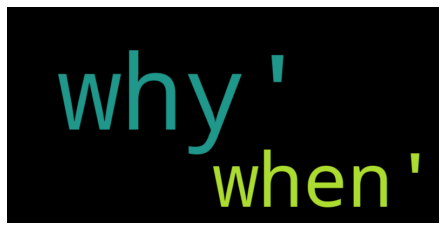

In [133]:
bad_char = ["[1]", '[2]', '[3]', '[4]', '[5]']
text = {}

if not os.path.exists('Figures'):
    os.mkdir('Figures')

if not os.path.exists('Figures/FedEx_POS'):
    os.mkdir('Figures/FedEx_POS')
    

for pos in pos_dict:
    text[pos] = pos_df_f[pos_df_f['pos'] == str(pos)]
    if len(pos_df_f[pos_df_f['pos'] == str(pos)]) == 0:
        pass
    else:
        print(pos)
        wordcloud = WordCloud(width=800, height=400).generate(str(text[pos].word.values))

        # Display the generated image:
        f = plt.figure()
        plt.imshow(wordcloud, interpolation = 'bilinear')
        plt.axis('off')
        plt.tight_layout(pad=0)
        plt.show()

   
        f.savefig(os.path.join('Figures/FedEx_POS','{}_cloud.jpg'.format(pos)), dpi=1000)

CC


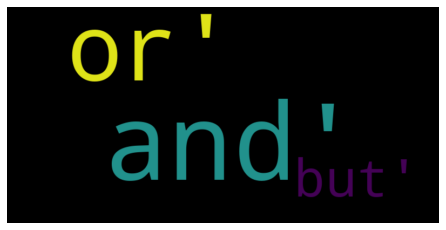

CD


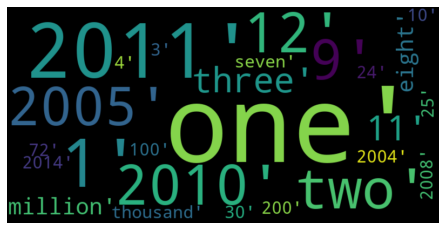

DT


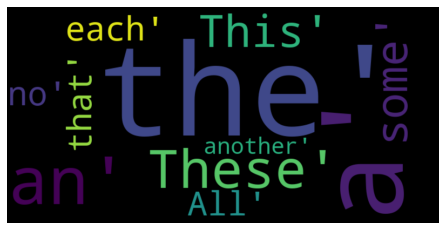

EX


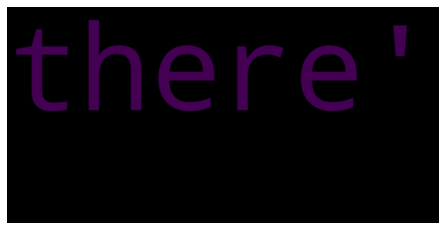

FW


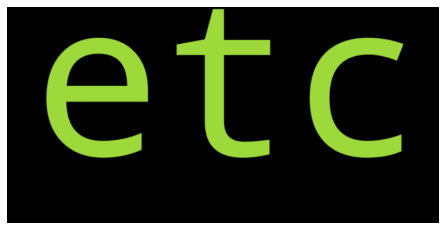

IN


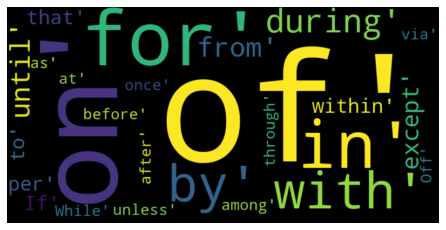

JJ


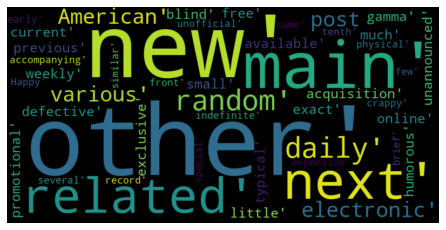

LS


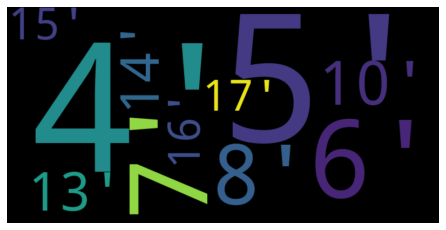

MD


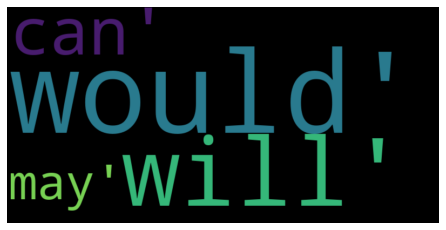

NN


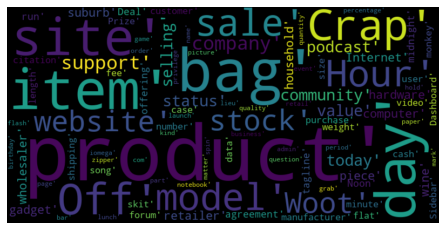

NNS


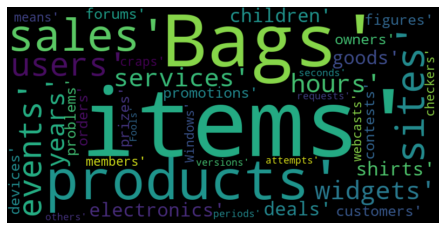

NNP


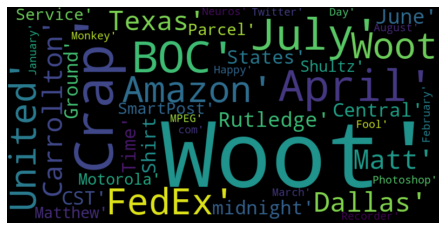

NNPS


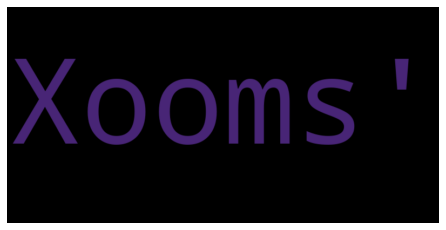

PRP


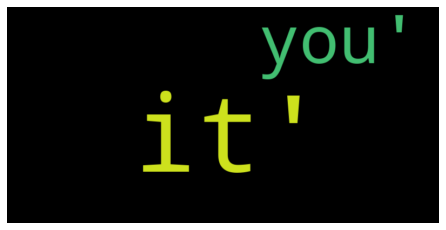

PRP$


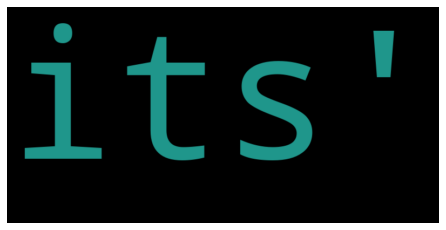

RB


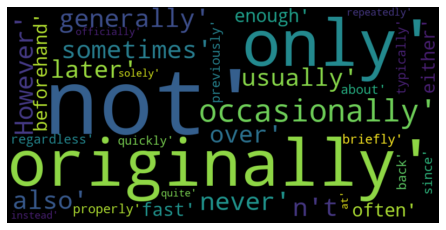

RBS


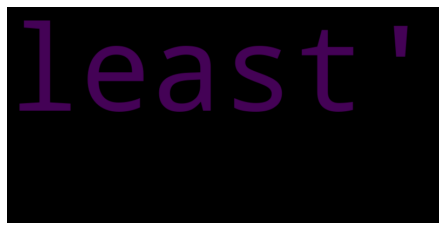

RP


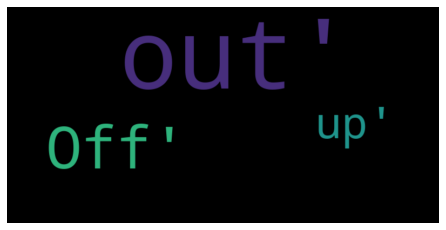

TO


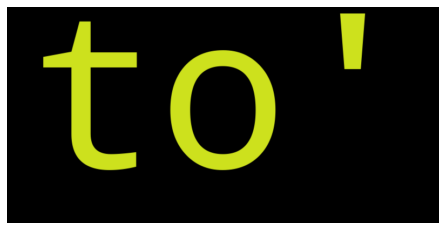

UH


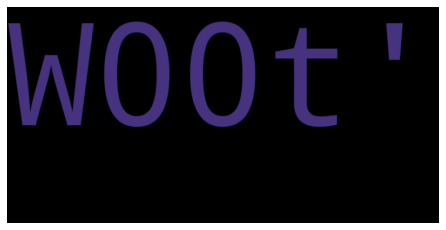

VB


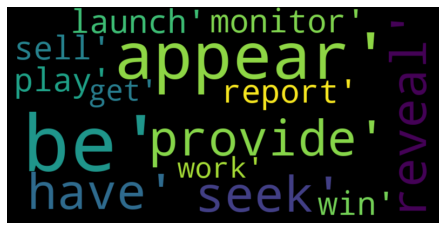

VBD


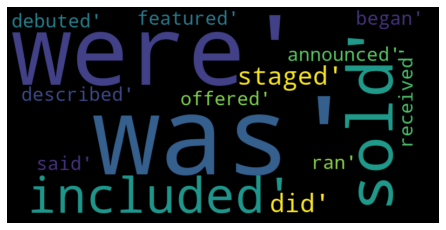

VBG


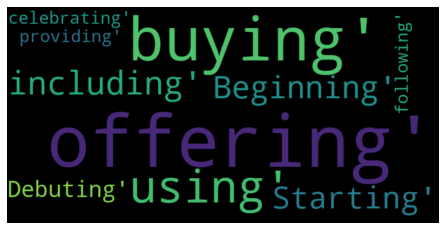

VBN


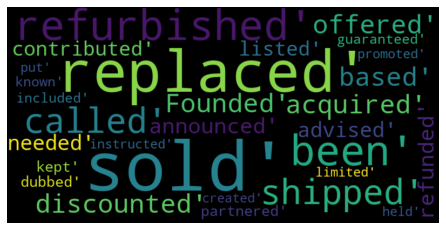

VBP


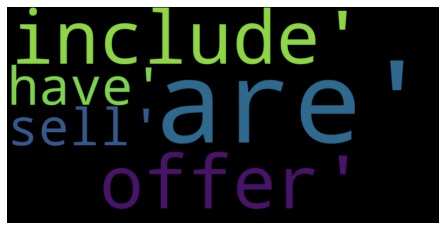

VBZ


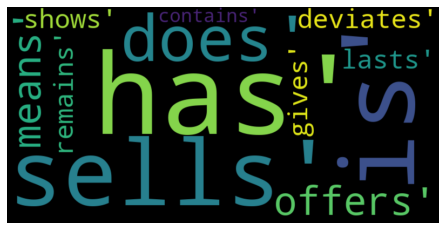

WDT


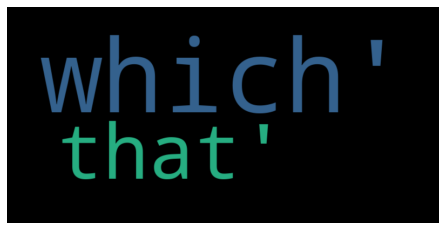

WP


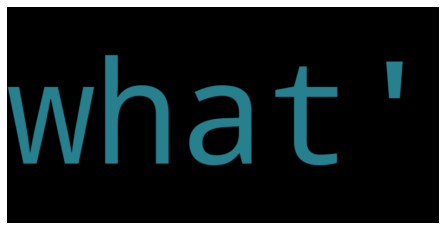

WP$


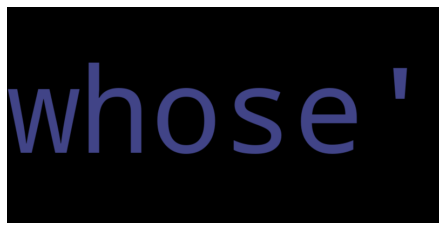

WRB


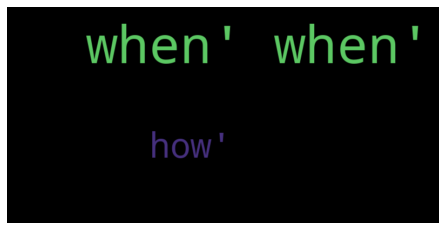

In [134]:
bad_char = ["[1]", '[2]', '[3]', '[4]', '[5]']
text = {}

if not os.path.exists('Figures'):
    os.mkdir('Figures')

if not os.path.exists('Figures/Woot_POS'):
    os.mkdir('Figures/Woot_POS')
    

for pos in pos_dict:
    text[pos] = pos_df_w[pos_df_w['pos'] == str(pos)]
    if len(pos_df_w[pos_df_w['pos'] == str(pos)]) == 0:
        pass
    else:
        print(pos)
        wordcloud = WordCloud(width=800, height=400).generate(str(text[pos].word.values))

        # Display the generated image:
        f = plt.figure()
        plt.imshow(wordcloud, interpolation = 'bilinear')
        plt.axis('off')
        plt.tight_layout(pad=0)
        plt.show()

   
        f.savefig(os.path.join('Figures/Woot_POS','{}_cloud.jpg'.format(pos)), dpi=1000)

CC


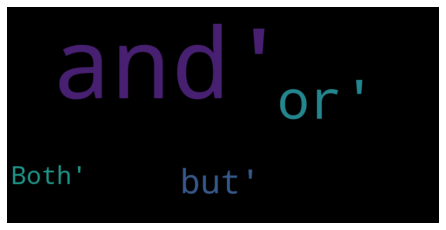

CD


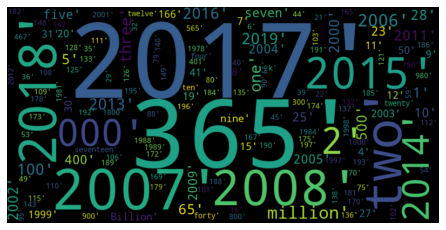

DT


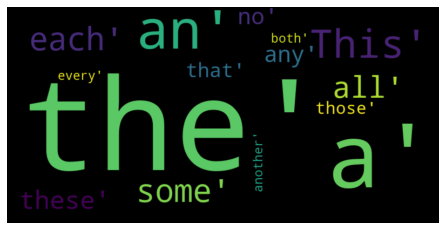

EX


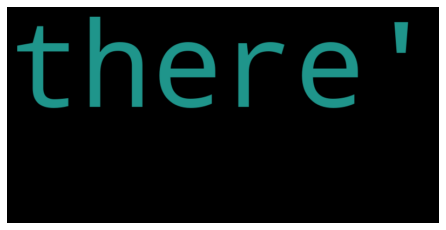

IN


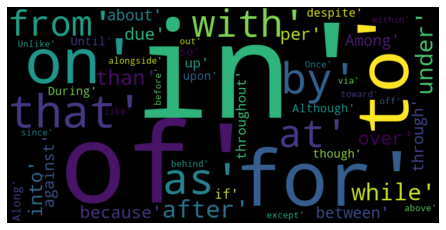

JJ


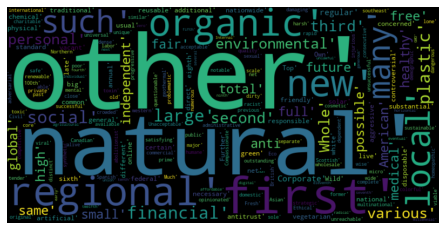

JJR


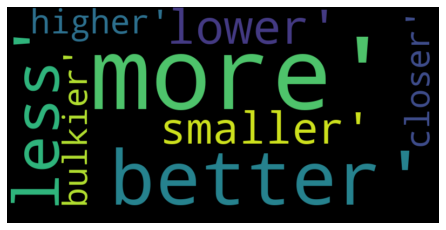

JJS


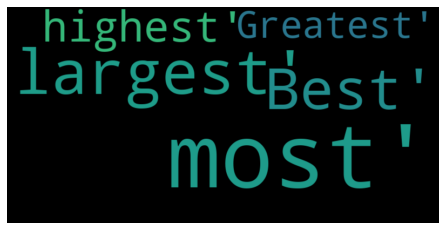

LS


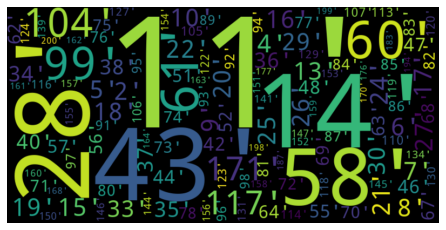

MD


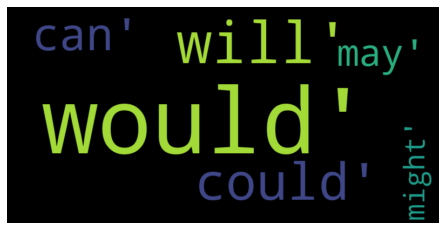

NN


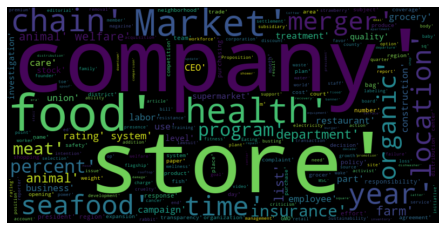

NNS


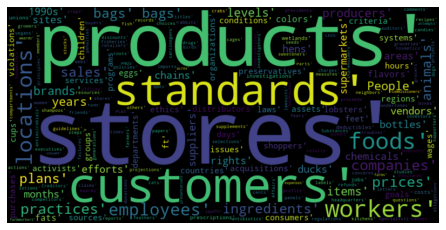

NNP


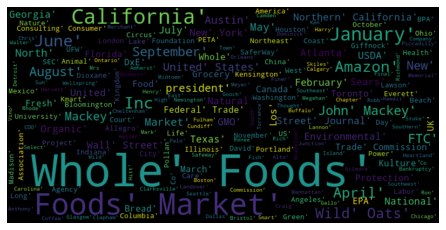

NNPS


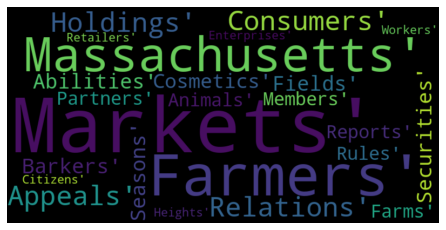

PRP


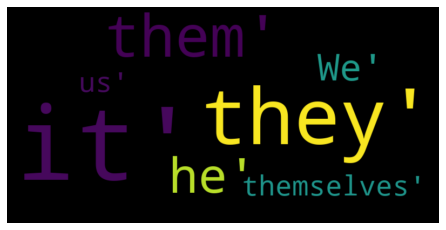

PRP$


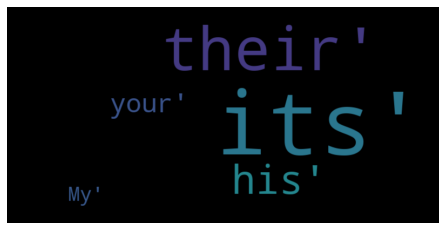

RB


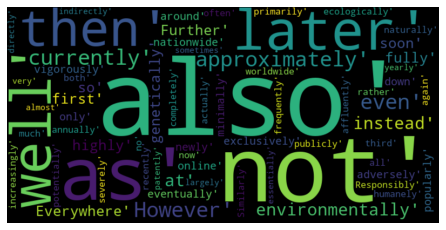

RBR


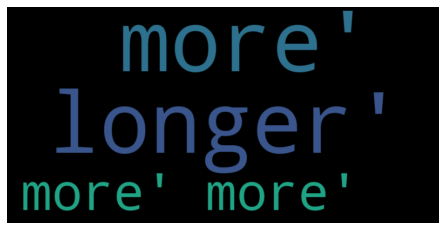

RBS


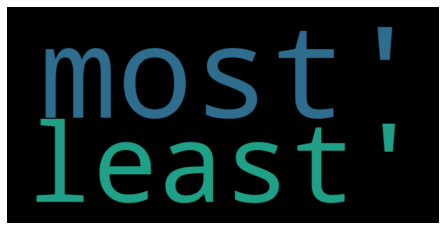

RP


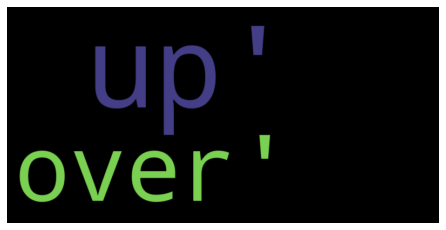

TO


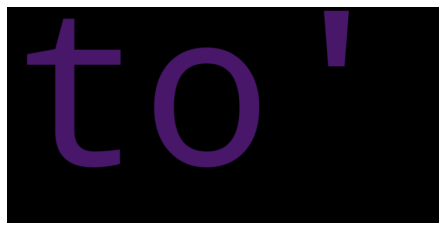

VB


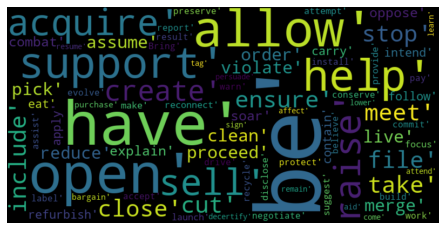

VBD


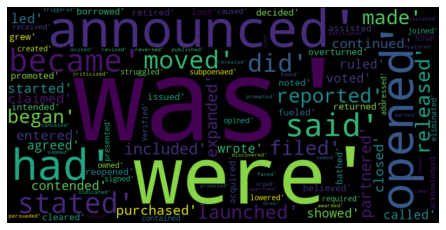

VBG


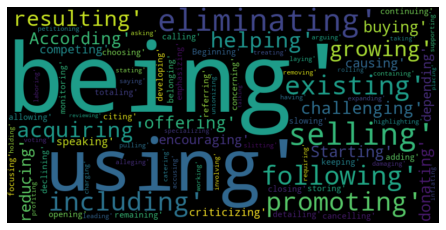

VBN


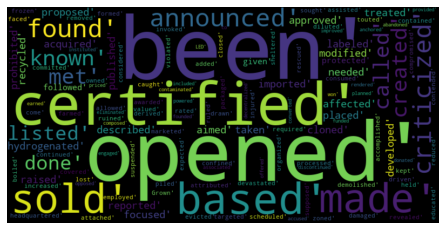

VBP


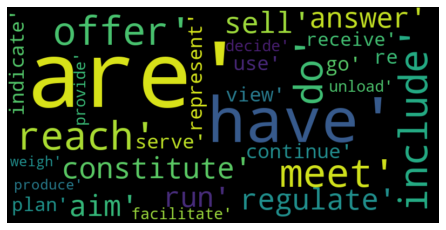

VBZ


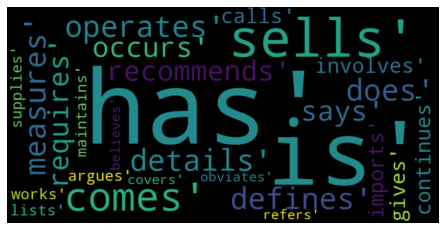

WDT


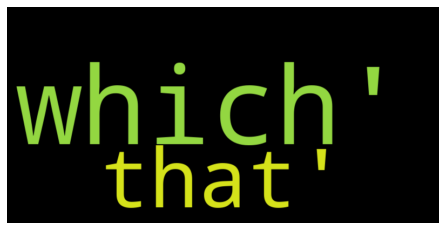

WP


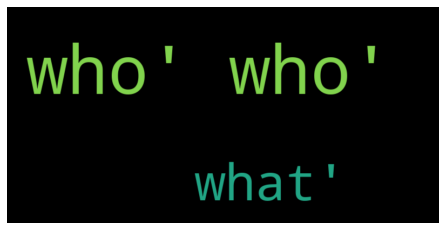

WP$


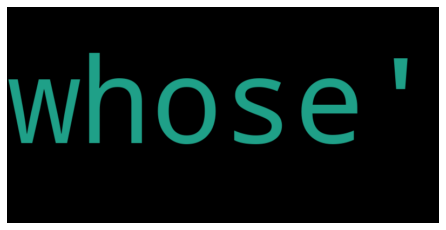

WRB


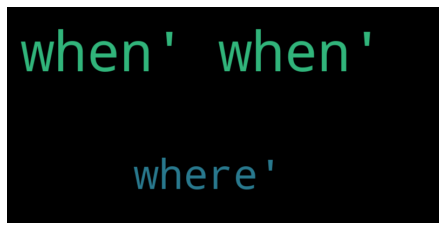

In [135]:
bad_char = ["[1]", '[2]', '[3]', '[4]', '[5]']
text = {}

if not os.path.exists('Figures'):
    os.mkdir('Figures')

if not os.path.exists('Figures/WholeFoods_POS'):
    os.mkdir('Figures/WholeFoods_POS')
    

for pos in pos_dict:
    if pos == 'FW':
        pass
    else:
        text[pos] = pos_df_wf[pos_df_wf['pos'] == str(pos)]
        if len(pos_df_wf[pos_df_wf['pos'] == str(pos)]) == 0:
            pass
        else:
            print(pos)
            wordcloud = WordCloud(width=800, height=400).generate(str(text[pos].word.values))

            # Display the generated image:
            f = plt.figure()
            plt.imshow(wordcloud, interpolation = 'bilinear')
            plt.axis('off')
            plt.tight_layout(pad=0)
            plt.show()
            f.savefig(os.path.join('Figures/WholeFoods_POS','{}_cloud.jpg'.format(pos)), dpi=1000)

CC


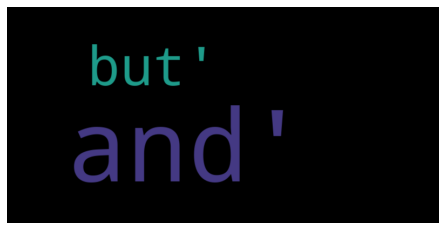

CD


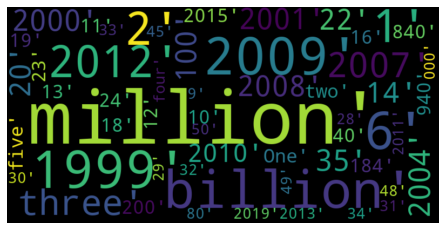

DT


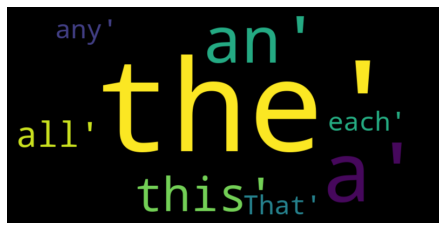

EX


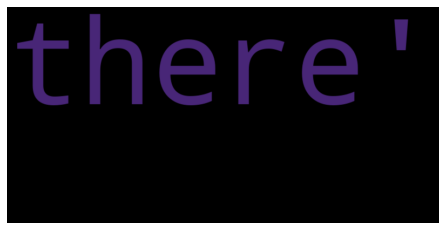

IN


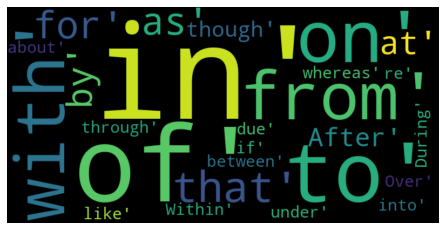

JJ


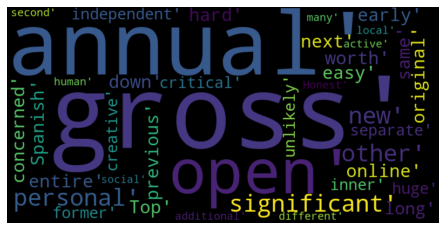

JJS


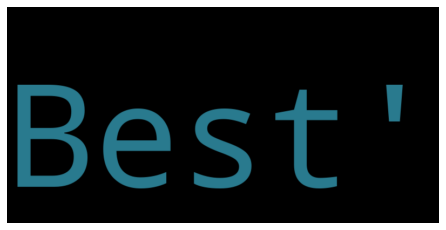

LS


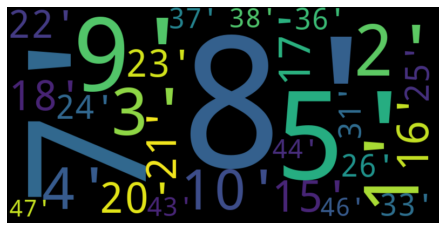

MD


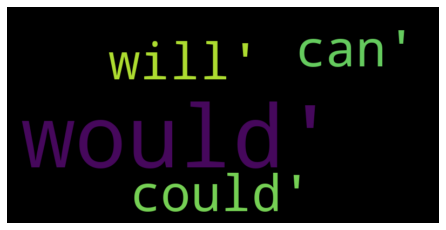

NN


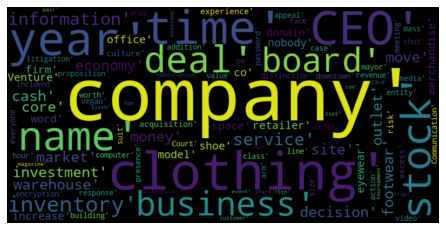

NNS


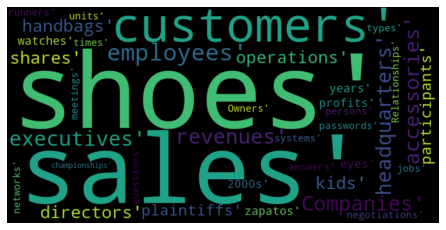

NNP


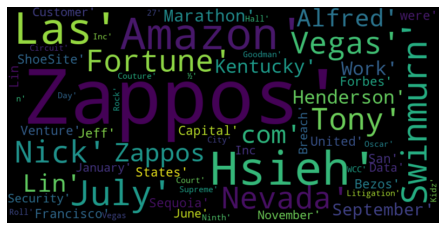

NNPS


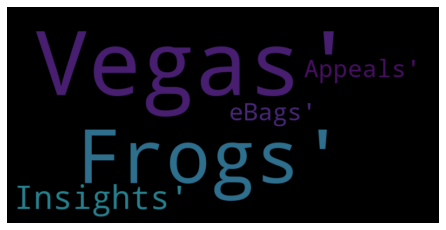

PDT


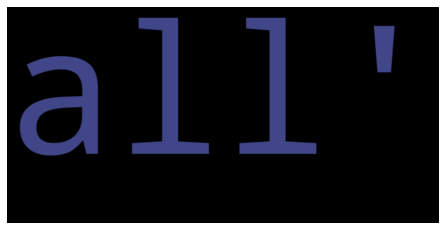

PRP


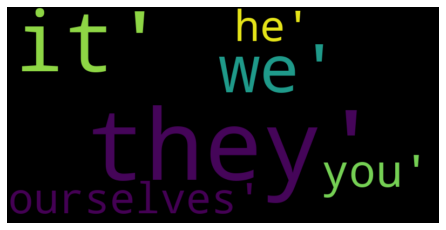

PRP$


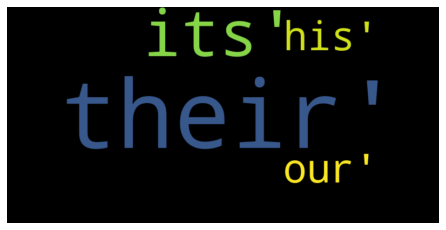

RB


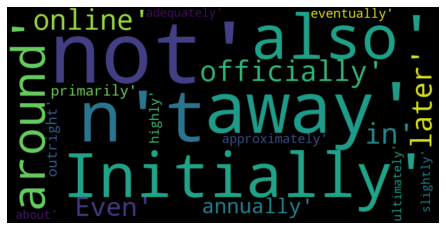

RP


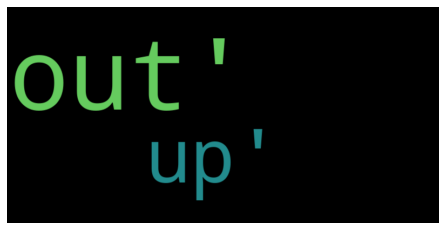

TO


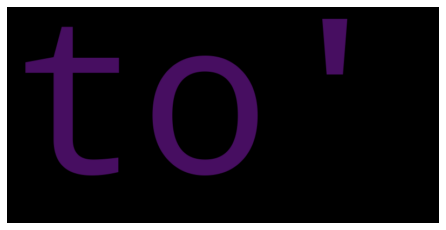

VB


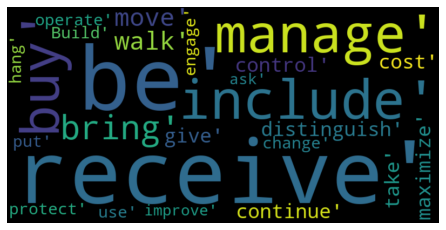

VBD


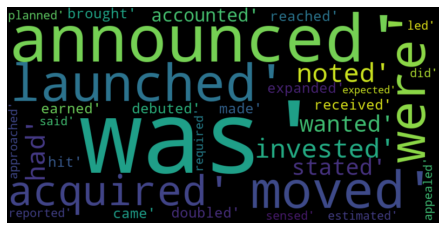

VBG


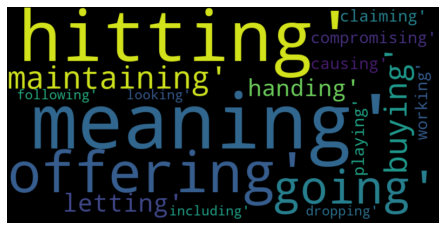

VBN


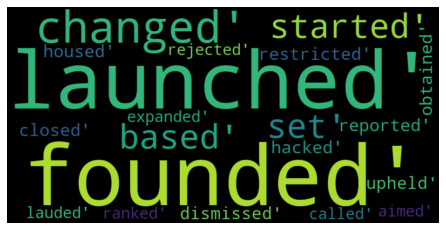

VBP


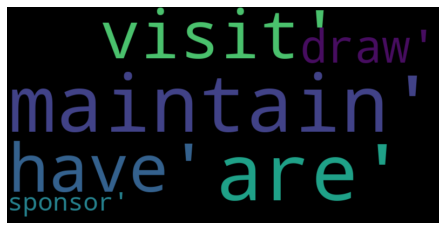

VBZ


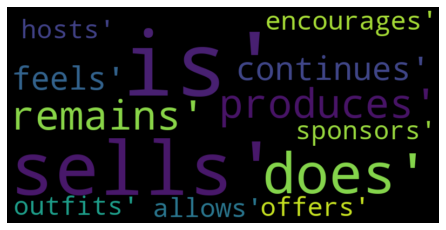

WDT


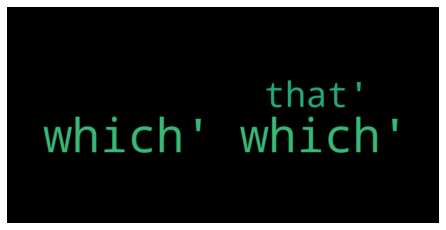

WP


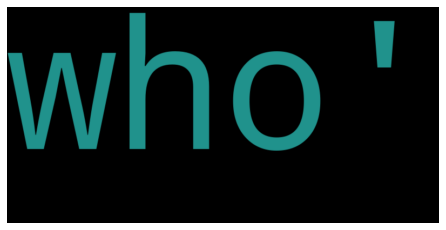

WRB


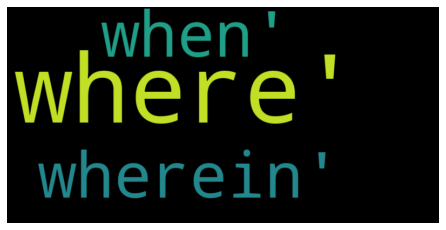

In [136]:
bad_char = ["[1]", '[2]', '[3]', '[4]', '[5]']
text = {}

if not os.path.exists('Figures'):
    os.mkdir('Figures')

if not os.path.exists('Figures/Zappos_POS'):
    os.mkdir('Figures/Zappos_POS')
    

for pos in pos_dict:
    text[pos] = pos_df_z[pos_df_z['pos'] == str(pos)]
    if len(pos_df_z[pos_df_z['pos'] == str(pos)]) == 0:
        pass
    else:
        print(pos)
        wordcloud = WordCloud(width=800, height=400).generate(str(text[pos].word.values))

        # Display the generated image:
        f = plt.figure()
        plt.imshow(wordcloud, interpolation = 'bilinear')
        plt.axis('off')
        plt.tight_layout(pad=0)
        plt.show()

   
        f.savefig(os.path.join('Figures/Zappos_POS','{}_cloud.jpg'.format(pos)), dpi=1000)

In [49]:
pos_df[pos_df['pos'] == 'NN'].word.values

array(['ˈæməzɒn', 'technology', 'company', ..., 'lobbying', 'firm',
       'aviation'], dtype=object)

In [27]:
doc

In [28]:
text_a

'Amazon.com, Inc.[6] (/ˈæməzɒn/), is an American multinational technology company based in Seattle that focuses on e-commerce, cloud computing, digital streaming, and artificial intelligence. It is considered one of the Big Four tech companies, along with Google, Apple, and Facebook.[7][8][9]\nAmazon is known for its disruption of well-established industries through technological innovation and mass scale.[10][11][12] It is the world\'s largest online marketplace, AI assistant provider, and cloud computing platform[13] as measured by revenue and market capitalization.[14] Amazon is the largest Internet company by revenue in the world.[15] It is the second largest private employer in the United States[16] and one of the world\'s most valuable companies.\nAmazon was founded by Jeff Bezos in Bellevue, Washington, in July 1994. The company initially started as an online marketplace for books but later expanded to sell electronics, software, video games, apparel, furniture, food, toys, and 

In [92]:
import re
import pandas as pd
import bs4
import requests
import spacy
from spacy import displacy
nlp = spacy.load('en_core_web_sm')

from spacy.matcher import Matcher 
from spacy.tokens import Span 

import networkx as nx

import matplotlib.pyplot as plt
from tqdm import tqdm

pd.set_option('display.max_colwidth', 200)
%matplotlib inline

2019-12-04 13:16:17 [matplotlib.pyplot] DEBUG: Loaded backend module://ipykernel.pylab.backend_inline version unknown.


## Spacy Did not use

In [95]:
text_amazon = """
Amazon.com, Inc.[6] (/ˈæməzɒn/), is an American multinational technology company based in Seattle, Washington, that focuses on e-commerce, cloud computing, digital streaming, and artificial intelligence. It is considered one of the Big Four technology companies along with Google, Apple, and Facebook.[7][8][9]

Amazon is known for its disruption of well-established industries through technological innovation and mass scale.[10][11][12] It is the world's largest e-commerce marketplace, AI assistant provider, and cloud computing platform[13] as measured by revenue and market capitalization.[14] Amazon is the largest Internet company by revenue in the world.[15] It is the second largest private employer in the United States[16] and one of the world's most valuable companies. Amazon is the second largest technology company by revenue.

Amazon was founded by Jeff Bezos on July 5, 1994, in Bellevue, Washington. The company initially started as an online marketplace for books but later expanded to sell electronics, software, video games, apparel, furniture, food, toys, and jewelry. In 2015, Amazon surpassed Walmart as the most valuable retailer in the United States by market capitalization.[17] In 2017, Amazon acquired Whole Foods Market for $13.4 billion, which vastly increased Amazon's presence as a brick-and-mortar retailer.[18] In 2018, Bezos announced that its two-day delivery service, Amazon Prime, had surpassed 100 million subscribers worldwide.[19][20]

Amazon distributes downloads and streaming of video, music, audiobook through its Amazon Prime Video, Amazon Music, and Audible subsidiaries. Amazon also has a publishing arm, Amazon Publishing, a film and television studio, Amazon Studios, and a cloud computing subsidiary, Amazon Web Services. It produces consumer electronics including Kindle e-readers, Fire tablets, Fire TV, and Echo devices. In addition, Amazon subsidiaries include Ring, Twitch.tv, Whole Foods Market, and IMDb. Among various controversies, the company has been criticized for technological surveillance overreach,[21] a hyper-competitive and demanding work culture,[22] tax avoidance,[23] and anti-competitive practices.[24]

In 1994, Jeff Bezos incorporated Amazon. He chose the location Seattle because of technical talent as Microsoft is located there.[25] In May 1997, the organization went public. The company began selling music and videos in 1998, at which time it began operations internationally by acquiring online sellers of books in United Kingdom and Germany. The following year, the organization also sold video games, consumer electronics, home-improvement items, software, games, and toys in addition to other items.

In 2002, the corporation started Amazon Web Services (AWS), which provided data on Web site popularity, Internet traffic patterns and other statistics for marketers and developers. In 2006, the organization grew its AWS portfolio when Elastic Compute Cloud (EC2), which rents computer processing power as well as Simple Storage Service (S3), that rents data storage via the Internet, were made available. That same year, the company started Fulfillment by Amazon which managed the inventory of individuals and small companies selling their belongings through the company internet site. In 2012, Amazon bought Kiva Systems to automate its inventory-management business, purchasing Whole Foods Market supermarket chain five years later in 2017.[26]

In 2000, U.S. toy retailer Toys "R" Us entered into a 10-year agreement with Amazon, valued at $50 million per year plus a cut of sales, under which Toys "R" Us would be the exclusive supplier of toys and baby products on the service, and the chain's website would redirect to Amazon's Toys & Games category. In 2004, Toys "R" Us sued Amazon, claiming that because of a perceived lack of variety in Toys "R" Us stock, Amazon had knowingly allowed third-party sellers to offer items on the service in categories that Toys "R" Us had been granted exclusivity. In 2006, a court ruled in favor of Toys "R" Us, giving it the right to unwind its agreement with Amazon and establish its own independent e-commerce website. The company was later awarded $51 million in damages.[28][29][30]

In 2001, Amazon entered into a similar agreement with Borders Group, under which Amazon would comanage Borders.com as a co-branded service.[31] Borders pulled out of the arrangement in 2007, with plans to also launch its own online store.[32]

On October 18, 2011, Amazon.com announced a partnership with DC Comics for the exclusive digital rights to many popular comics, including Superman, Batman, Green Lantern, The Sandman, and Watchmen. The partnership has caused well-known bookstores like Barnes & Noble to remove these titles from their shelves.[33]

In November 2013, Amazon announced a partnership with the United States Postal Service to begin delivering orders on Sundays. The service, included in Amazon's standard shipping rates, initiated in metropolitan areas of Los Angeles and New York because of the high-volume and inability to deliver in a timely way, with plans to expand into Dallas, Houston, New Orleans and Phoenix by 2014.[34]

In June 2017, Nike confirmed a "pilot" partnership with Amazon to sell goods directly on the platform.[35][36][37]

As of October 11, 2017, AmazonFresh sold a range of Booths branded products for home delivery in selected areas.[38]

In September 2017, Amazon ventured with one of its sellers JV Appario Retail owned by Patni Group which has recorded a total income of US$ 104.44 million (₹ 759 crore) in financial year 2017–18.[39]

In November 2018, Amazon reached an agreement with Apple Inc. to sell selected products through the service, via the company and selected Apple Authorized Resellers. As a result of this partnership, only Apple Authorized Resellers may sell Apple products on Amazon effective January 4, 2019.[40][41]

Amazon.com's product lines available at its website include several media (books, DVDs, music CDs, videotapes and software), apparel, baby products, consumer electronics, beauty products, gourmet food, groceries, health and personal-care items, industrial & scientific supplies, kitchen items, jewelry, watches, lawn and garden items, musical instruments, sporting goods, tools, automotive items and toys & games.[citation needed] In August 2019, Amazon applied to have a liquor store in San Francisco, CA as a means to ship beer and alcohol within the city.[42] Amazon has separate retail websites for some countries and also offers international shipping of some of its products to certain other countries.[43]

Amazon.com has a number of products and services available, including:

AmazonFresh
Amazon Prime
Amazon Web Services
Alexa
Appstore
Amazon Drive
Echo
Kindle
Fire tablets
Fire TV
Video
Kindle Store
Music
Music Unlimited
Amazon Digital Game Store
Amazon Studios
AmazonWireless



"""
bad_char = []
for i in range(90):
    bad_char.append(str('[' + str(i) + ']'))

# bad_char = ["[1]", '[2]', '[3]', '[4]', '[5]', ]

for cha in bad_char:
    text_amazon = text_amazon.replace(cha,'')

In [96]:
doc = nlp(text_amazon)

In [97]:
import spacy
nlp = spacy.load('en_core_web_sm')

# doc = nlp("The 22-year-old recently won ATP Challenger tournament.")

for tok in doc:
  print(tok.text, "...", tok.dep_)


 ... 
Amazon.com ... ROOT
, ... punct
Inc. ... npadvmod
( ... punct
/ˈæməzɒn/ ... parataxis
) ... punct
, ... punct
is ... ROOT
an ... det
American ... amod
multinational ... amod
technology ... compound
company ... attr
based ... acl
in ... prep
Seattle ... pobj
, ... punct
Washington ... appos
, ... punct
that ... nsubj
focuses ... relcl
on ... prep
e ... compound
- ... punct
commerce ... pobj
, ... punct
cloud ... compound
computing ... conj
, ... punct
digital ... amod
streaming ... conj
, ... punct
and ... cc
artificial ... amod
intelligence ... conj
. ... punct
It ... nsubjpass
is ... auxpass
considered ... ROOT
one ... oprd
of ... prep
the ... det
Big ... compound
Four ... compound
technology ... compound
companies ... pobj
along ... prep
with ... prep
Google ... pobj
, ... punct
Apple ... conj
, ... punct
and ... cc
Facebook ... conj
. ... punct


 ... 
Amazon ... nsubjpass
is ... auxpass
known ... ROOT
for ... prep
its ... poss
disruption ... pobj
of ... prep
well ... advmod


Toys ... nmod
" ... punct
R ... nmod
" ... punct
Us ... compound
stock ... pobj
, ... punct
Amazon ... nsubj
had ... aux
knowingly ... advmod
allowed ... ccomp
third ... amod
- ... punct
party ... compound
sellers ... nsubj
to ... aux
offer ... ccomp
items ... dobj
on ... prep
the ... det
service ... pobj
in ... prep
categories ... pobj
that ... mark
Toys ... nmod
" ... punct
R ... nmod
" ... punct
Us ... nsubjpass
had ... aux
been ... auxpass
granted ... acl
exclusivity ... dobj
. ... punct
In ... prep
2006 ... pobj
, ... punct
a ... det
court ... nsubj
ruled ... ROOT
in ... prep
favor ... pobj
of ... prep
Toys ... nmod
" ... punct
R ... nmod
" ... punct
Us ... pobj
, ... punct
giving ... advcl
it ... dative
the ... det
right ... dobj
to ... aux
unwind ... acl
its ... poss
agreement ... dobj
with ... prep
Amazon ... pobj
and ... cc
establish ... conj
its ... poss
own ... amod
independent ... amod
e ... compound
- ... punct
commerce ... compound
website ... dobj
. ... punct
The ... det

Fire ... nsubj
tablets ... ROOT

 ... 
Fire ... compound
TV ... dobj

 ... 
Video ... conj

 ... 
Kindle ... compound
Store ... conj

 ... 
Music ... conj

 ... 
Music ... compound
Unlimited ... nmod

 ... 
Amazon ... compound
Digital ... compound
Game ... compound
Store ... ROOT

 ... 
Amazon ... appos
Studios ... ROOT

 ... 
AmazonWireless ... appos




 ... 


In [98]:
def get_entities(sent):
  ## chunk 1
  ent1 = ""
  ent2 = ""

  prv_tok_dep = ""    # dependency tag of previous token in the sentence
  prv_tok_text = ""   # previous token in the sentence

  prefix = ""
  modifier = ""

  #############################################################
  
  for tok in nlp(sent):
    ## chunk 2
    # if token is a punctuation mark then move on to the next token
    if tok.dep_ != "punct":
      # check: token is a compound word or not
      if tok.dep_ == "compound":
        prefix = tok.text
        # if the previous word was also a 'compound' then add the current word to it
        if prv_tok_dep == "compound":
          prefix = prv_tok_text + " "+ tok.text
      
      # check: token is a modifier or not
      if tok.dep_.endswith("mod") == True:
        modifier = tok.text
        # if the previous word was also a 'compound' then add the current word to it
        if prv_tok_dep == "compound":
          modifier = prv_tok_text + " "+ tok.text
      
      ## chunk 3
      if tok.dep_.find("subj") == True:
        ent1 = modifier +" "+ prefix + " "+ tok.text
        prefix = ""
        modifier = ""
        prv_tok_dep = ""
        prv_tok_text = ""      

      ## chunk 4
      if tok.dep_.find("obj") == True:
        ent2 = modifier +" "+ prefix +" "+ tok.text
        
      ## chunk 5  
      # update variables
      prv_tok_dep = tok.dep_
      prv_tok_text = tok.text
  #############################################################

  return [ent1.strip(), ent2.strip()]

In [101]:
def get_relation(sent):

  doc = nlp(sent)

  # Matcher class object 
  matcher = Matcher(nlp.vocab)

  #define the pattern 
  pattern = [{'DEP':'ROOT'}, 
            {'DEP':'prep','OP':"?"},
            {'DEP':'agent','OP':"?"},  
            {'POS':'ADJ','OP':"?"}] 

  matcher.add("matching_1", None, pattern) 

  matches = matcher(doc)
  k = len(matches) - 1

  span = doc[matches[k][1]:matches[k][2]] 

  return(span.text)

In [99]:
sentences = [sent.string.strip() for sent in doc.sents]

In [102]:
relations = [get_relation(i) for i in tqdm(sentences)]


100%|██████████| 51/51 [00:00<00:00, 121.00it/s]


In [103]:
entity_pairs = []

for i in tqdm(sentences):
  entity_pairs.append(get_entities(i))


100%|██████████| 51/51 [00:00<00:00, 122.88it/s]


In [104]:
# extract subject
source = [i[0] for i in entity_pairs]

# extract object
target = [i[1] for i in entity_pairs]

kg_df = pd.DataFrame({'source':source, 'target':target, 'edge':relations})


In [105]:
# create a directed-graph from a dataframe
G=nx.from_pandas_edgelist(kg_df, "source", "target", 
                          edge_attr=True, create_using=nx.MultiDiGraph())

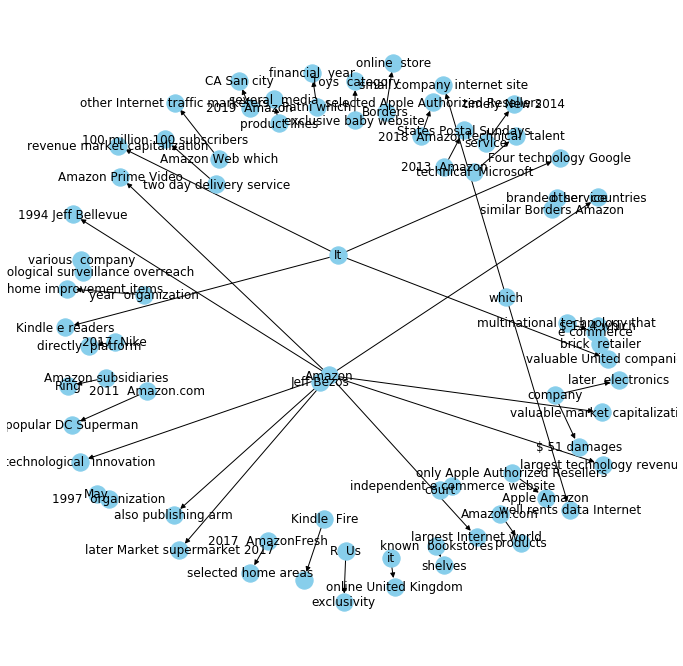

In [110]:
f = plt.figure(figsize=(12,12))

pos = nx.spring_layout(G)

# f = plt.figure()


nx.draw(G, with_labels=True, node_color='skyblue', edge_cmap=plt.cm.Blues, pos = pos, ax=f.add_subplot(111))




f.savefig(os.path.join('Figures/Amazon_POS','Amazon_spacy.jpg'), dpi=500)
plt.show()